In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, make_scorer
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import DBSCAN
from sklearn.cluster import SpectralClustering
from sklearn.model_selection import GridSearchCV
from sklearn.base import BaseEstimator
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

# load data

In [2]:
combined_df = pd.read_csv('preprocessed data/combined_df.csv', index_col=0)

# preprocessing data

### SEX를 0(F)와 1(M)으로 이진분류함

In [3]:
combined_df[['SEX']] = combined_df[['SEX']].applymap(lambda x: 0 if x=='F' else 1).astype('int64')

C:\Users\top\AppData\Local\Temp\ipykernel_11612\2229972446.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  combined_df[['SEX']] = combined_df[['SEX']].applymap(lambda x: 0 if x=='F' else 1).astype('int64')


### AGE의 20대(30대,40대)의 '대'를 제외시키고 정수화함

In [4]:
combined_df[['AGE']] = combined_df[['AGE']].applymap(lambda x: x[:-1]).astype('int64')

C:\Users\top\AppData\Local\Temp\ipykernel_11612\3561243492.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  combined_df[['AGE']] = combined_df[['AGE']].applymap(lambda x: x[:-1]).astype('int64')


### INCOME을 0(300만원 미만)과 1(700만원 이상)으로 이진분류함

In [5]:
# '300만원 미만'과 '700만원 미만'을 0으로 변환
combined_df.loc[combined_df['INCOME'] == '300만원 미만', 'INCOME'] = 0
combined_df.loc[combined_df['INCOME'] == '700만원 이상', 'INCOME'] = 1
combined_df['INCOME'] = combined_df['INCOME'].astype('int64')

### 'Total', 'Lodgement', 'Food', 'Transport', 'Shopping', 'Activity', 'Etc' 컬럼을 최소값의 정수값으로 변환

In [6]:
combined_df[['Total', 'Lodgement', 'Food', 'Transport', 'Shopping', 'Activity', 'Etc']] = combined_df[['Total', 'Lodgement', 'Food', 'Transport', 'Shopping', 'Activity', 'Etc']].applymap(lambda x: x[0:2] if x[1]=='0' else x[0])
combined_df[['Total', 'Lodgement', 'Food', 'Transport', 'Shopping', 'Activity', 'Etc']] = combined_df[['Total', 'Lodgement', 'Food', 'Transport', 'Shopping', 'Activity', 'Etc']].astype('int64')

C:\Users\top\AppData\Local\Temp\ipykernel_11612\1381664632.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  combined_df[['Total', 'Lodgement', 'Food', 'Transport', 'Shopping', 'Activity', 'Etc']] = combined_df[['Total', 'Lodgement', 'Food', 'Transport', 'Shopping', 'Activity', 'Etc']].applymap(lambda x: x[0:2] if x[1]=='0' else x[0])


### Company를 혼자인 경우는 1로, 나머지는 0번째 자리 숫자를 인덱싱함.

In [7]:
combined_df[['Company']] = combined_df[['Company']].applymap(lambda x: x[0] if x != '혼자서' else 1).astype('int64')

C:\Users\top\AppData\Local\Temp\ipykernel_11612\2890160913.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  combined_df[['Company']] = combined_df[['Company']].applymap(lambda x: x[0] if x != '혼자서' else 1).astype('int64')


### Per_Diem의 여행일(n일)의 n만 추출

In [8]:
combined_df[['Per_Diem']] = combined_df[['Per_Diem']].applymap(lambda x: x.split(' ')[1][0]).astype('int64')

C:\Users\top\AppData\Local\Temp\ipykernel_11612\3208453903.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  combined_df[['Per_Diem']] = combined_df[['Per_Diem']].applymap(lambda x: x.split(' ')[1][0]).astype('int64')


### Married를 0(미혼) 1(기혼)으로 이진 분류함

In [9]:
combined_df[['Married']] = combined_df[['Married']].applymap(lambda x: 1 if x =='기혼' else 0).astype('int64')

C:\Users\top\AppData\Local\Temp\ipykernel_11612\347267838.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  combined_df[['Married']] = combined_df[['Married']].applymap(lambda x: 1 if x =='기혼' else 0).astype('int64')


# OneHotEncoding

In [10]:
len(combined_df['District'].unique()) #404
# District 컬럼은 404개로 복잡성이 큼. 그리고 AREA 컬럼이 어느정도의 대표성을 가지기에 drop함
combined_df.drop('District',axis=1, inplace=True)

In [11]:
def encoding(*cols):
    df_encoded = combined_df.copy()
    for index, col in enumerate(cols):
        encoder = OneHotEncoder(sparse_output=False)
        onehot = encoder.fit_transform(combined_df[[col]])
        onehot_df = pd.DataFrame(onehot, columns=encoder.get_feature_names_out([col]))
        if index == '0':
            df_encoded = pd.concat([combined_df, onehot_df], axis=1)
        else:
            df_encoded = pd.concat([df_encoded,onehot_df], axis=1)
    return df_encoded

In [12]:
df_encoded = encoding('AREA','Children','Occupation')
df_encoded.drop(['AREA','Children','Occupation'], axis=1,inplace=True)
df_encoded

,RESPOND_ID,EXAMIN_BEGIN_DE,SEX,AGE,INCOME,SEOUL,GYEONGGI,BUSAN,CHUNGNAM,CHUNGBUK,...,Children_자녀 성장(막내 중고생),Children_자녀 유아&성장(막내 입학전~초등생),Occupation_경영/관리/전문직,Occupation_기능/숙련/일반작업직,Occupation_기타/무직,Occupation_대학/대학원생,Occupation_사무/기술직,Occupation_자영업,Occupation_전업주부,Occupation_판매/서비스직
0,53364346,20240101,0,50,1,3,4,3,3,3,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,53363665,20240101,0,50,0,3,3,4,3,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,53322894,20240101,0,50,1,3,4,4,3,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,53349009,20240101,0,50,1,1,2,3,4,4,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,53340551,20240101,0,40,1,3,3,3,3,3,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1568,53366910,20241230,1,50,0,2,2,2,2,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1569,53367792,20241230,0,50,1,3,3,3,4,5,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1570,53367863,20241230,0,40,1,1,2,4,2,3,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1571,53369696,20241230,1,50,1,3,4,1,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [13]:
df_encoded.to_csv('preprocessed data/df_encoded.csv')

# clustring data(Minmax scaler -> kmeans)

In [14]:
#minmax scaler에 넣을 컬럼 선정
minmax_columns = df_encoded.columns.tolist()[2:26]

#onehot columns를 다른 변수에 저장
onehot_columns = df_encoded.columns.tolist()[26:]

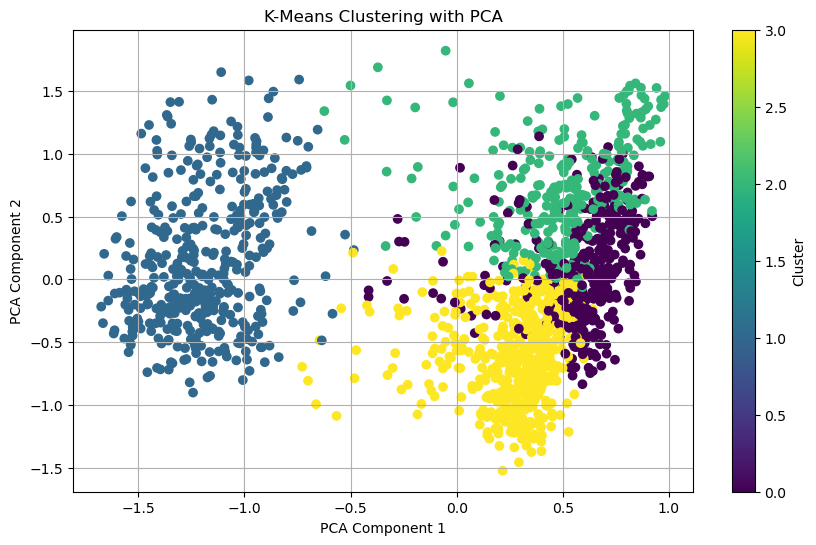

In [15]:
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_encoded[minmax_columns])

X = pd.concat([pd.DataFrame(scaled_data),df_encoded[onehot_columns]], axis=1).to_numpy()
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)
df_encoded['Cluster'] = kmeans.labels_

# PCA로 차원 축소
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# 시각화
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=df_encoded['Cluster'], cmap='viridis', marker='o')
plt.title('K-Means Clustering with PCA')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster')
plt.grid()
plt.show()

df_encoded.drop(['Cluster'], axis=1, inplace=True)

In [16]:
# 클러스터 수 범위 설정
k_values = range(1, 10)  # 1부터 9까지의 클러스터 수

sse = []  # SSE 값을 저장할 리스트
silhouette_scores = []  # 실루엣 점수를 저장할 리스트

# 클러스터 수에 따른 KMeans 모델 학습 및 평가
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)

    # SSE 저장
    sse.append(kmeans.inertia_)

    # 실루엣 점수 계산
    if k > 1:  # 클러스터 수가 1보다 클 때만 계산
        silhouette_avg = silhouette_score(X, kmeans.labels_)
        silhouette_scores.append(silhouette_avg)
        print(f'클러스터 수: {k}, 실루엣 점수: {silhouette_avg:.2f}')
    else:
        silhouette_scores.append(None)  # 클러스터 수가 1일 때는 None

클러스터 수: 2, 실루엣 점수: 0.13
클러스터 수: 3, 실루엣 점수: 0.10
클러스터 수: 4, 실루엣 점수: 0.10
클러스터 수: 5, 실루엣 점수: 0.09
클러스터 수: 6, 실루엣 점수: 0.09
클러스터 수: 7, 실루엣 점수: 0.10
클러스터 수: 8, 실루엣 점수: 0.08
클러스터 수: 9, 실루엣 점수: 0.08


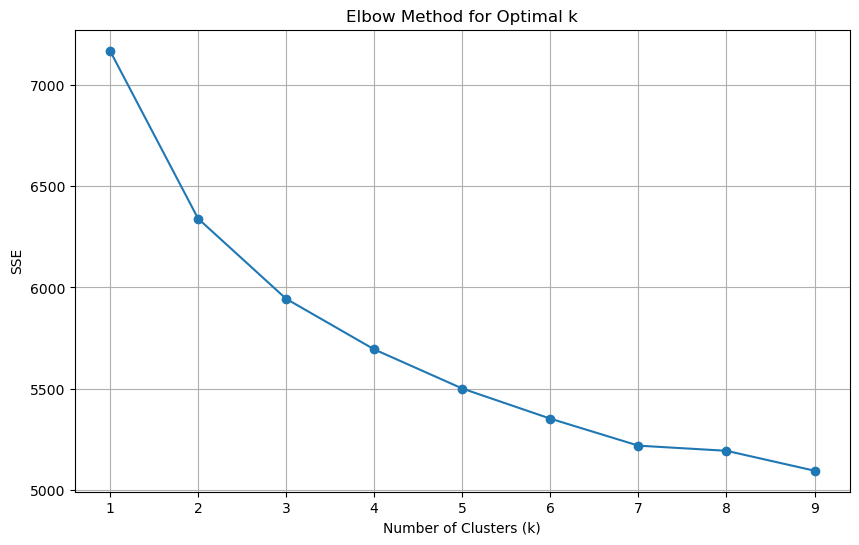

In [17]:
# KMeans 모델을 사용하여 SSE 계산
sse = []
k_values = range(1, 10)  # 클러스터 수 범위

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    sse.append(kmeans.inertia_)  # SSE

# 엘보우 그래프 그리기
plt.figure(figsize=(10, 6))
plt.plot(k_values, sse, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('SSE')
plt.grid()
plt.show()

# clustering(minmax scaler -> pca -> kmeans)

In [18]:
# 다양한 주성분 수에 대해 KMeans 클러스터링 수행
components_range = range(2, 11)  # 2에서 10까지의 주성분 수
results = {}

for n_components in components_range:
    # PCA 적용
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X)

    # 분산 비율 확인
    print(f"\n주성분 수: {n_components}")
    print("주성분의 분산 비율:", pca.explained_variance_ratio_)
    
    # 주성분의 누적 분산 비율 확인
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    print("누적 분산 비율:", cumulative_variance)

    # 클러스터 수 범위 설정
    k_values = range(1, 10)  # 1부터 9까지의 클러스터 수

    sse = []  # SSE 값을 저장할 리스트
    silhouette_scores = []  # 실루엣 점수를 저장할 리스트

    # 클러스터 수에 따른 KMeans 모델 학습 및 평가
    for k in k_values:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X_pca)
        
        # SSE 저장
        sse.append(kmeans.inertia_)
        
        # 실루엣 점수 계산
        if k > 1:  # 클러스터 수가 1보다 클 때만 계산
            silhouette_avg = silhouette_score(X_pca, kmeans.labels_)
            silhouette_scores.append(silhouette_avg)
            print(f'클러스터 수: {k}, 실루엣 점수: {silhouette_avg:.2f}')
        else:
            silhouette_scores.append(None)  # 클러스터 수가 1일 때는 None

    # 결과 저장
    results[n_components] = {
        "SSE": sse,
        "Silhouette Scores": silhouette_scores
    }



주성분 수: 2
주성분의 분산 비율: [0.12619362 0.09115742]
누적 분산 비율: [0.12619362 0.21735104]
클러스터 수: 2, 실루엣 점수: 0.55
클러스터 수: 3, 실루엣 점수: 0.52
클러스터 수: 4, 실루엣 점수: 0.47
클러스터 수: 5, 실루엣 점수: 0.47
클러스터 수: 6, 실루엣 점수: 0.44
클러스터 수: 7, 실루엣 점수: 0.39
클러스터 수: 8, 실루엣 점수: 0.37
클러스터 수: 9, 실루엣 점수: 0.37

주성분 수: 3
주성분의 분산 비율: [0.12619362 0.09115742 0.07252746]
누적 분산 비율: [0.12619362 0.21735104 0.28987851]
클러스터 수: 2, 실루엣 점수: 0.42
클러스터 수: 3, 실루엣 점수: 0.36
클러스터 수: 4, 실루엣 점수: 0.38
클러스터 수: 5, 실루엣 점수: 0.38
클러스터 수: 6, 실루엣 점수: 0.37
클러스터 수: 7, 실루엣 점수: 0.34
클러스터 수: 8, 실루엣 점수: 0.34
클러스터 수: 9, 실루엣 점수: 0.32

주성분 수: 4
주성분의 분산 비율: [0.12619362 0.09115742 0.07252746 0.06159288]
누적 분산 비율: [0.12619362 0.21735104 0.28987851 0.35147139]
클러스터 수: 2, 실루엣 점수: 0.35
클러스터 수: 3, 실루엣 점수: 0.29
클러스터 수: 4, 실루엣 점수: 0.29
클러스터 수: 5, 실루엣 점수: 0.26
클러스터 수: 6, 실루엣 점수: 0.25
클러스터 수: 7, 실루엣 점수: 0.25
클러스터 수: 8, 실루엣 점수: 0.25
클러스터 수: 9, 실루엣 점수: 0.25

주성분 수: 5
주성분의 분산 비율: [0.12619362 0.09115742 0.07252746 0.06159288 0.05645605]
누적 분산 비율: [0.12619362 0.21735104 0.2898

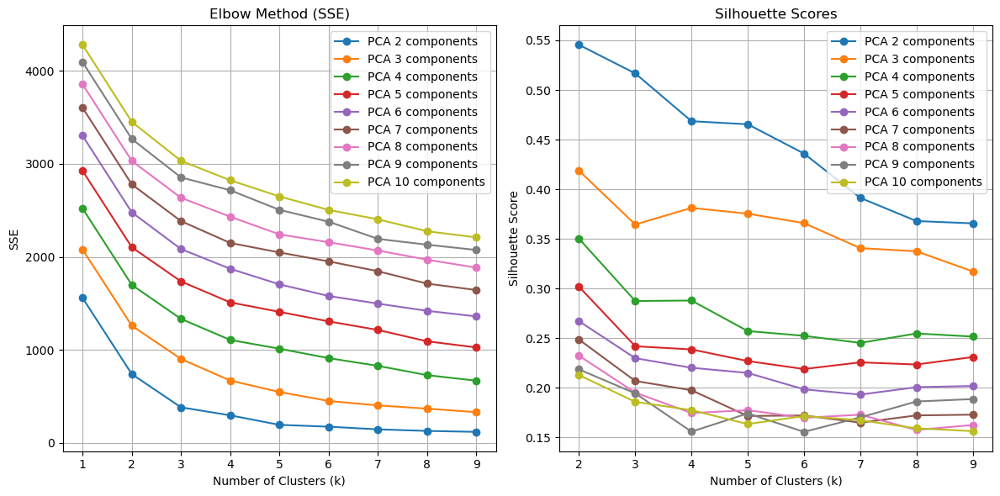

In [19]:
# 결과를 시각화
plt.figure(figsize=(12, 6))

# SSE 그래프
plt.subplot(1, 2, 1)
for n_components in components_range:
    plt.plot(range(1, 10), results[n_components]["SSE"], marker='o', label=f'PCA {n_components} components')
plt.title('Elbow Method (SSE)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('SSE')
plt.legend()
plt.grid()

# 실루엣 점수 그래프
plt.subplot(1, 2, 2)
for n_components in components_range:
    plt.plot(range(2, 10), results[n_components]["Silhouette Scores"][1:], marker='o', label=f'PCA {n_components} components')
plt.title('Silhouette Scores')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()


# PCA(2) -> kmeans(2)

pca-kmeans로 포괄적인 클러스터를 만들고, t-sne-bdscan으로 지협적인 클러스터를 생성

실루엣 점수: 0.55


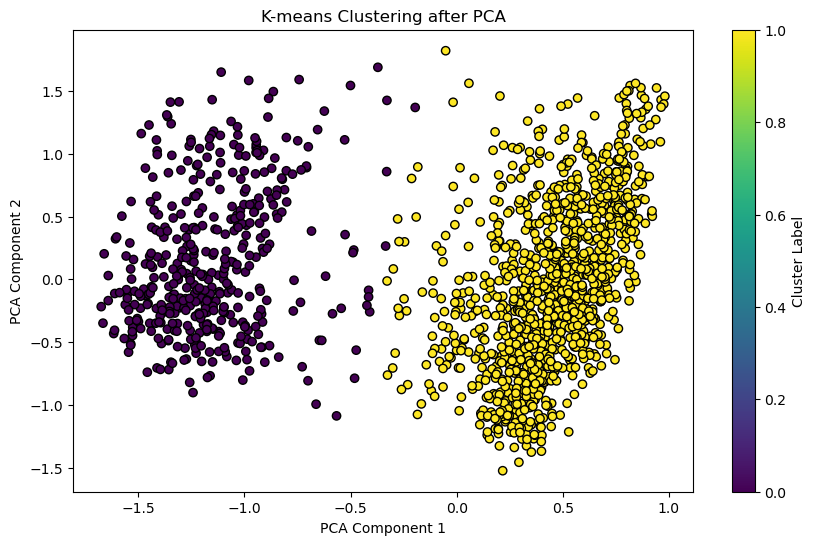

In [20]:
# 데이터프레임에서 필요한 컬럼 선택 및 스케일링
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_encoded[minmax_columns])

X = pd.concat([pd.DataFrame(scaled_data),df_encoded[onehot_columns]], axis=1).to_numpy()

# PCA를 사용하여 2차원으로 차원 축소
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# K-means 클러스터링 수행
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(X_pca)

# 클러스터 레이블을 데이터프레임에 추가
df_encoded['kmeans_cluster'] = kmeans.labels_

# 실루엣 점수 계산
silhouette_avg = silhouette_score(X_pca, kmeans.labels_)
print(f'실루엣 점수: {silhouette_avg:.2f}')

# K-means 클러스터링 결과 시각화
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans.labels_, cmap='viridis', marker='o', edgecolor='k')
plt.title('K-means Clustering after PCA')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster Label')
plt.show()


# MinMaxScaler -> t-SNE -> DBSCAN(min_samaple = dimension + 1)

In [21]:
combined_df.shape

(1573, 29)

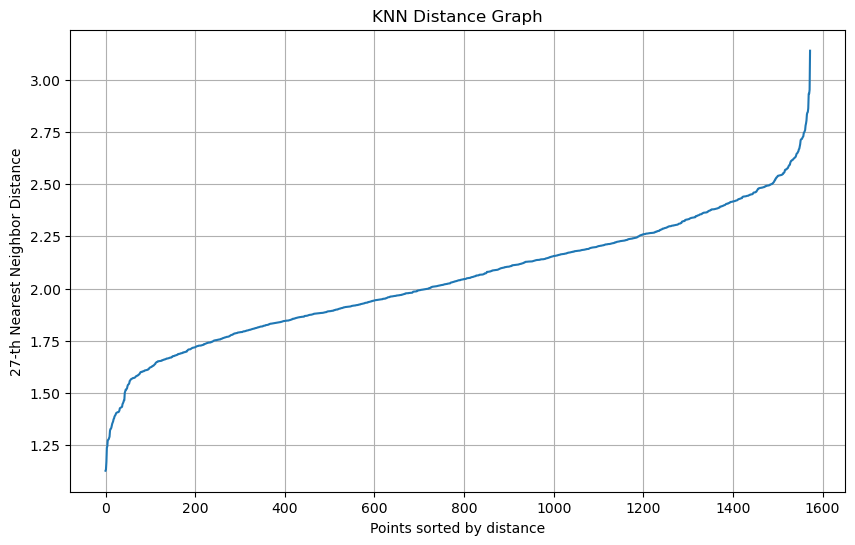

ValueError: could not convert string to float: ''

In [22]:
# 데이터프레임에서 필요한 컬럼 선택 및 스케일링
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_encoded[minmax_columns])

X = pd.concat([pd.DataFrame(scaled_data),df_encoded[onehot_columns]], axis=1).to_numpy()

# KNN 거리 그래프 생성
neighbors = 27 #combined_df(onehot 인코딩 전)의 차원 수로 설정
nbrs = NearestNeighbors(n_neighbors=neighbors+1).fit(X)
distances, indices = nbrs.kneighbors(X)

# KNN 거리 정렬
distances = np.sort(distances[:, neighbors - 1], axis=0)

# 거리 그래프 시각화
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title('KNN Distance Graph')
plt.xlabel('Points sorted by distance')
plt.ylabel(f'{neighbors}-th Nearest Neighbor Distance')
plt.grid()
plt.show()

# eps 값 선택 후 DBSCAN 적용
eps = float(input("선택한 eps 값을 입력하세요: "))  # 시각적으로 결정한 eps 값을 입력: 2.5
min_samples = 3  # 데이터의 차원 수 + 1 (27 + 1 = 28)

# t-SNE 적용
tsne = TSNE(n_components=2, random_state=42)
tsne_data = tsne.fit_transform(X)

# DBSCAN 클러스터링
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
dbscan_labels = dbscan.fit_predict(tsne_data)

# 클러스터 레이블 추가
df_encoded['dbscan_cluster'] = dbscan_labels

# t-SNE 결과 시각화
plt.figure(figsize=(10, 6))
plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c=dbscan_labels, cmap='viridis', marker='o', edgecolor='k')
plt.title('t-SNE with DBSCAN Clustering')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='DBSCAN Cluster')
plt.show()

# 실루엣 점수 계산 (노이즈를 제외한 클러스터만 사용)
if len(set(dbscan_labels)) > 1 and -1 in dbscan_labels:
    # 클러스터 레이블이 -1이 아닌 데이터만 선택
    valid_labels = dbscan_labels[dbscan_labels != -1]
    valid_data = tsne_data[dbscan_labels != -1]
    
    silhouette_avg = silhouette_score(valid_data, valid_labels)
    print(f'실루엣 점수: {silhouette_avg:.3f}')
else:
    print('유효한 클러스터가 없거나 클러스터가 하나뿐입니다.')


# 실루엣 계수 for loop 실험

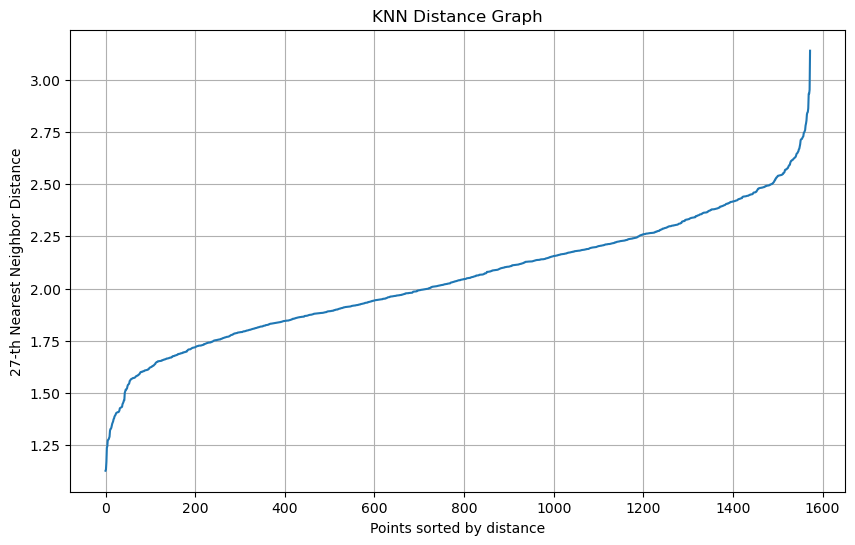

<<<<<<<<<<<<<<<<<<  min_samples = 1  >>>>>>>>>>>>>>>>>>>
eps: 1.25 min_samples: 1


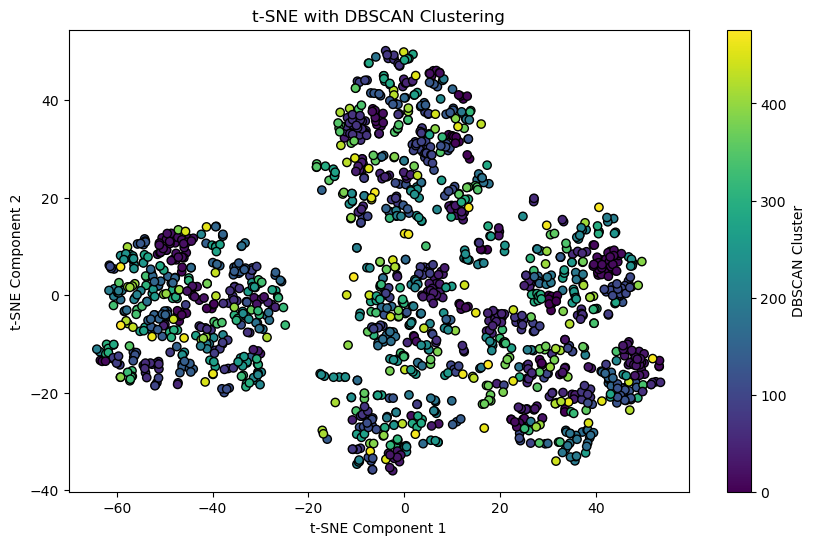

유효한 클러스터가 없거나 클러스터가 하나뿐입니다.
-1인 클러스터의 샘플수 1573 ---- -1 외의 클러스터의 샘플수 0
-1 클러스터의 샘플비율 0.0
-1 클러스터를 제외한 샘플비율 100.0
477


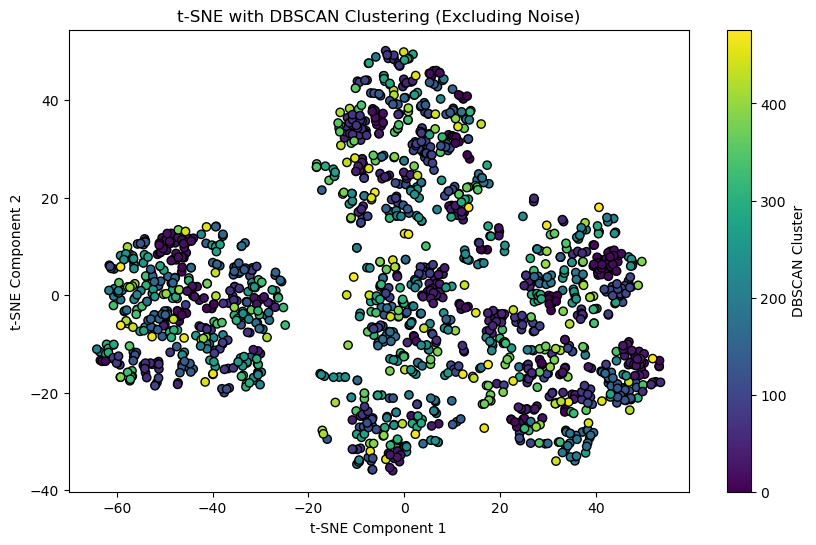

<<<<<<<<<<<<<<<<<<  min_samples = 2  >>>>>>>>>>>>>>>>>>>
eps: 1.25 min_samples: 2


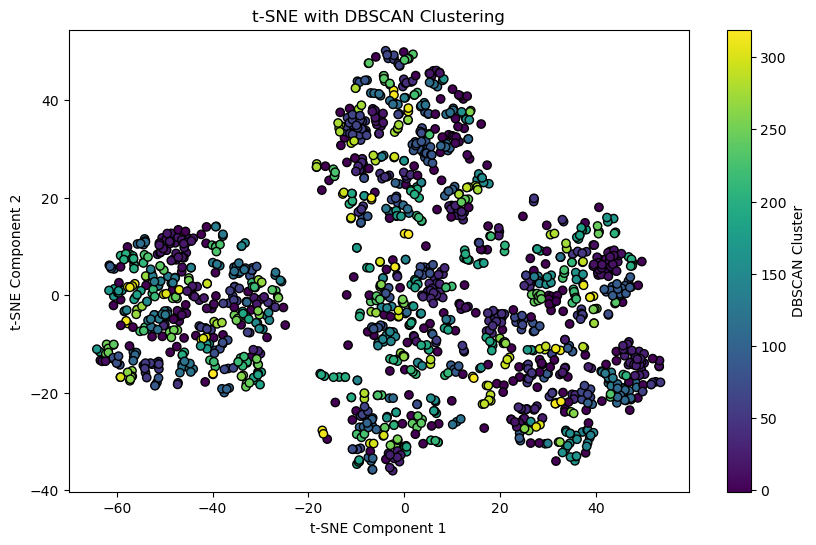

실루엣 점수: 0.529
-1인 클러스터의 샘플수 1416 ---- -1 외의 클러스터의 샘플수 157
-1 클러스터의 샘플비율 9.980928162746345
-1 클러스터를 제외한 샘플비율 90.01907183725365
320


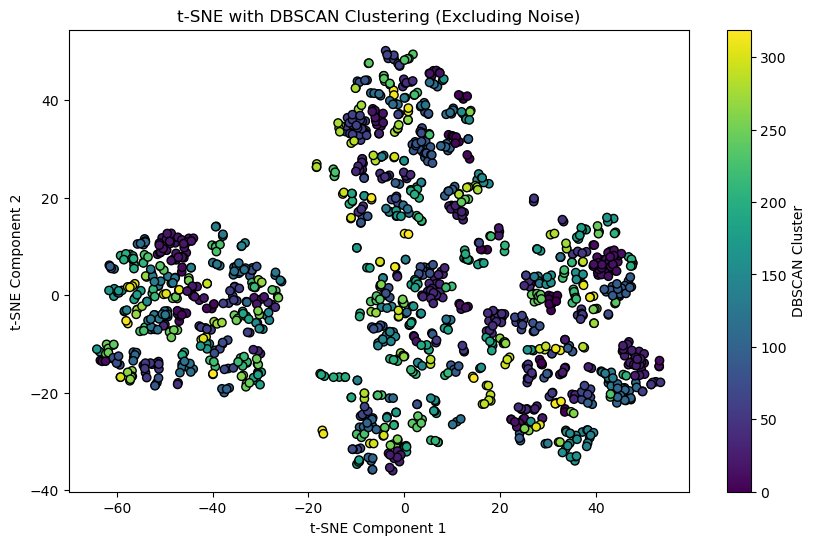

<<<<<<<<<<<<<<<<<<  min_samples = 3  >>>>>>>>>>>>>>>>>>>
eps: 1.25 min_samples: 3


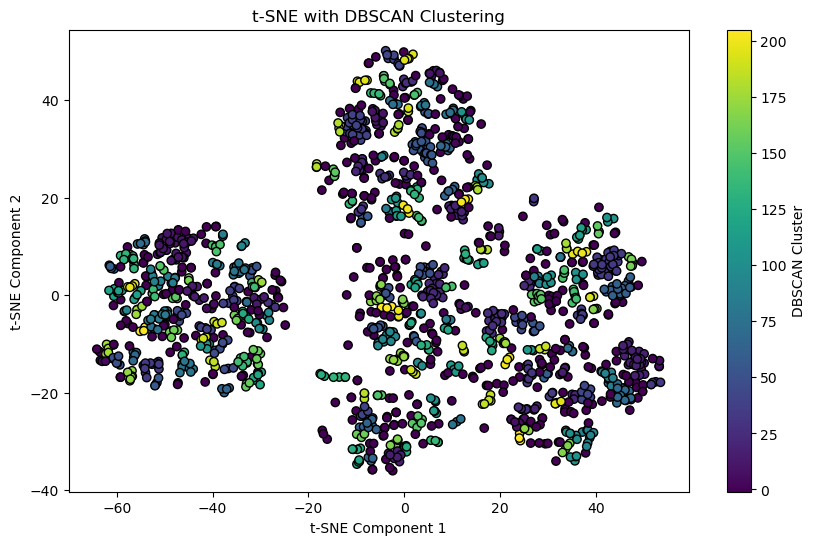

실루엣 점수: 0.544
-1인 클러스터의 샘플수 1188 ---- -1 외의 클러스터의 샘플수 385
-1 클러스터의 샘플비율 24.475524475524477
-1 클러스터를 제외한 샘플비율 75.52447552447552
206


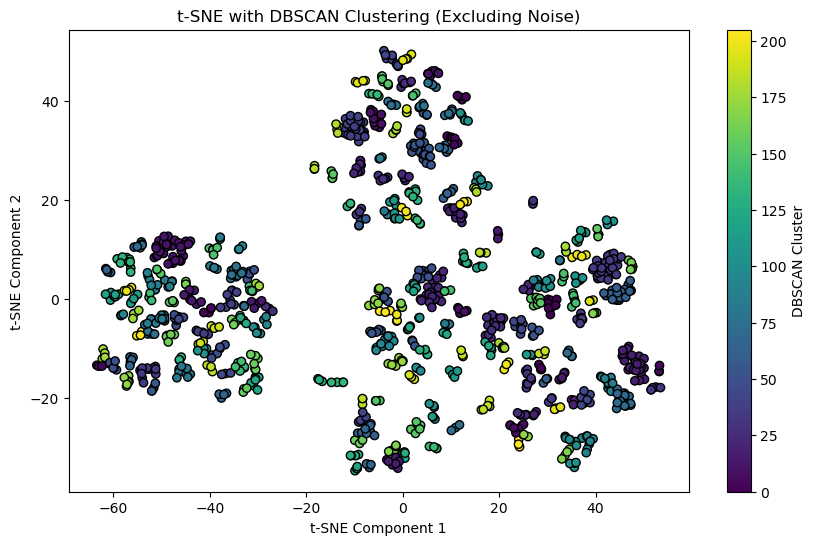

<<<<<<<<<<<<<<<<<<  min_samples = 4  >>>>>>>>>>>>>>>>>>>
eps: 1.25 min_samples: 4


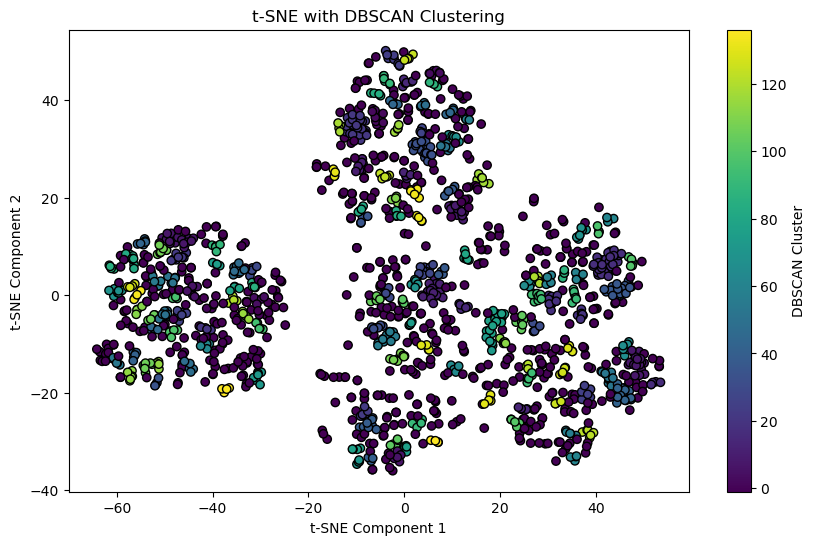

실루엣 점수: 0.595
-1인 클러스터의 샘플수 913 ---- -1 외의 클러스터의 샘플수 660
-1 클러스터의 샘플비율 41.95804195804196
-1 클러스터를 제외한 샘플비율 58.04195804195804
137


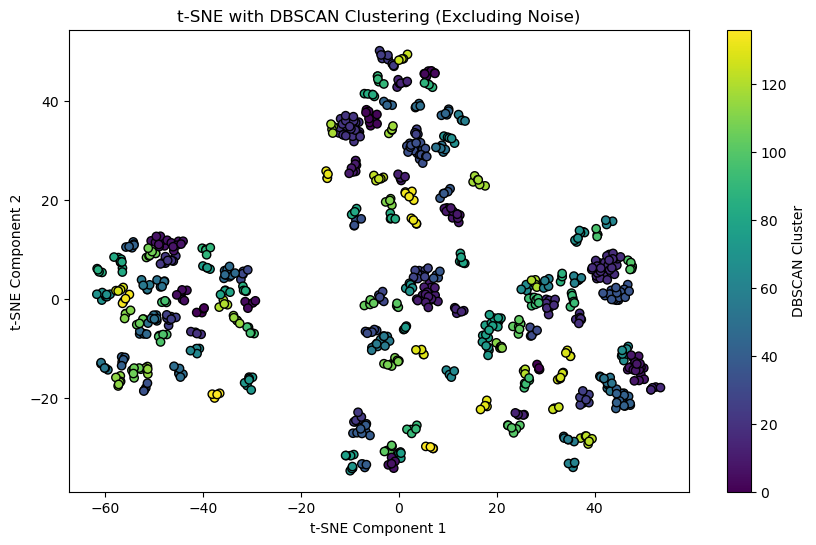

<<<<<<<<<<<<<<<<<<  min_samples = 5  >>>>>>>>>>>>>>>>>>>
eps: 1.25 min_samples: 5


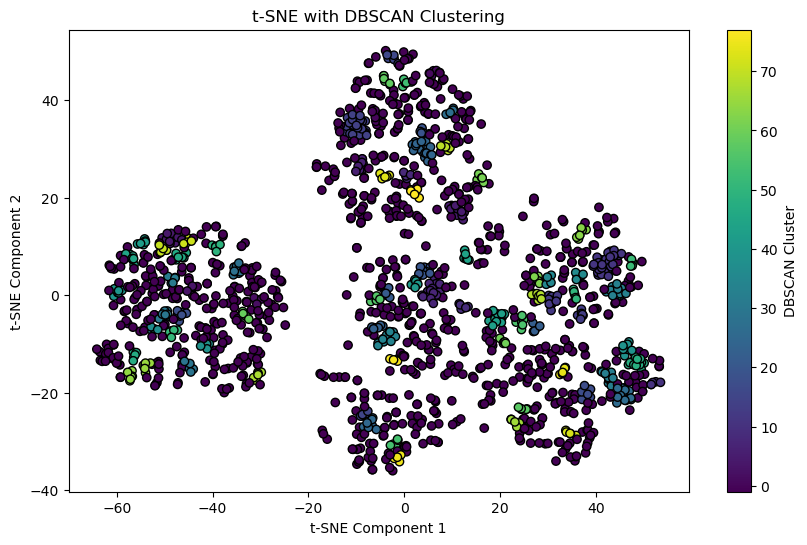

실루엣 점수: 0.642
-1인 클러스터의 샘플수 619 ---- -1 외의 클러스터의 샘플수 954
-1 클러스터의 샘플비율 60.64844246662429
-1 클러스터를 제외한 샘플비율 39.35155753337571
78


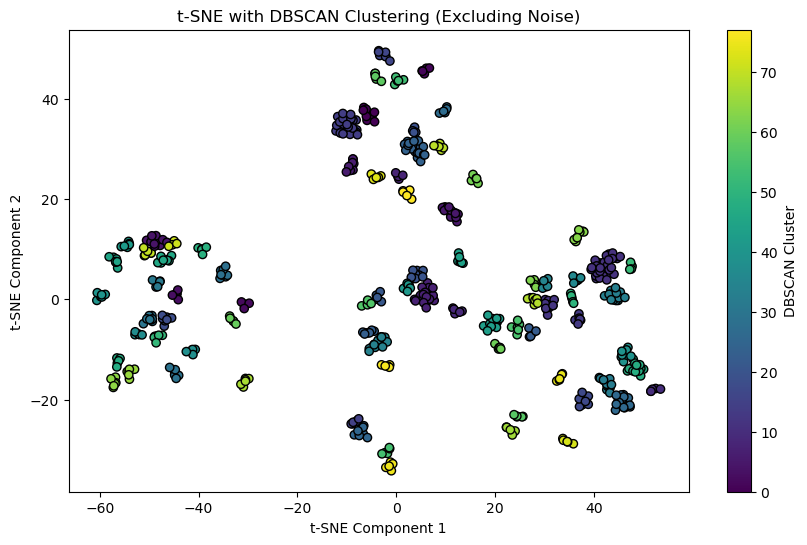

<<<<<<<<<<<<<<<<<<  min_samples = 6  >>>>>>>>>>>>>>>>>>>
eps: 1.25 min_samples: 6


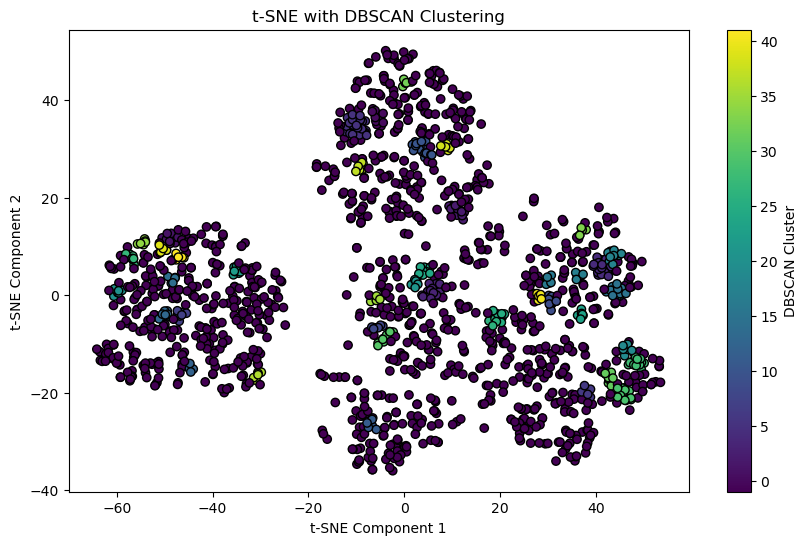

실루엣 점수: 0.645
-1인 클러스터의 샘플수 395 ---- -1 외의 클러스터의 샘플수 1178
-1 클러스터의 샘플비율 74.88874761602034
-1 클러스터를 제외한 샘플비율 25.111252383979654
42


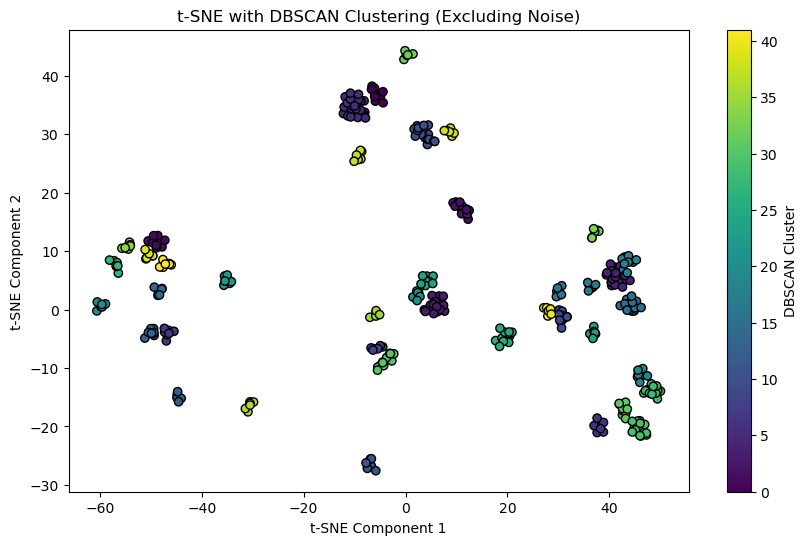

<<<<<<<<<<<<<<<<<<  min_samples = 7  >>>>>>>>>>>>>>>>>>>
eps: 1.25 min_samples: 7


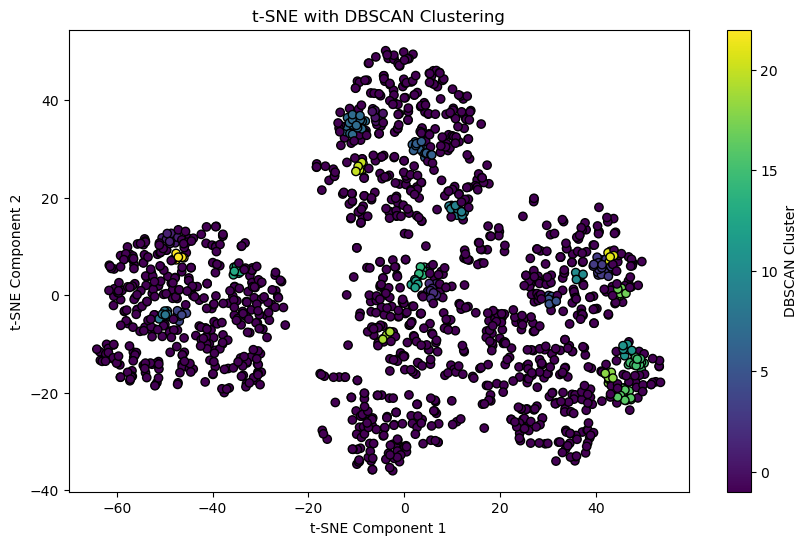

실루엣 점수: 0.676
-1인 클러스터의 샘플수 242 ---- -1 외의 클러스터의 샘플수 1331
-1 클러스터의 샘플비율 84.61538461538461
-1 클러스터를 제외한 샘플비율 15.384615384615385
23


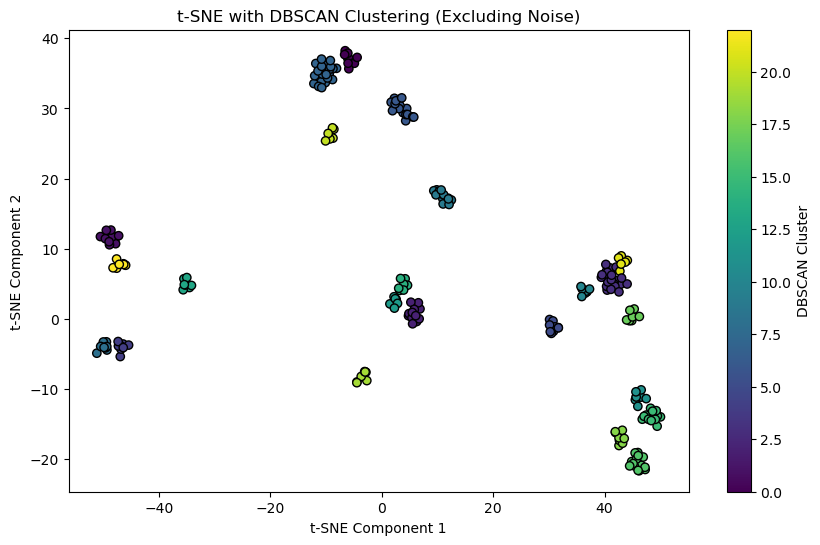

<<<<<<<<<<<<<<<<<<  min_samples = 8  >>>>>>>>>>>>>>>>>>>
eps: 1.25 min_samples: 8


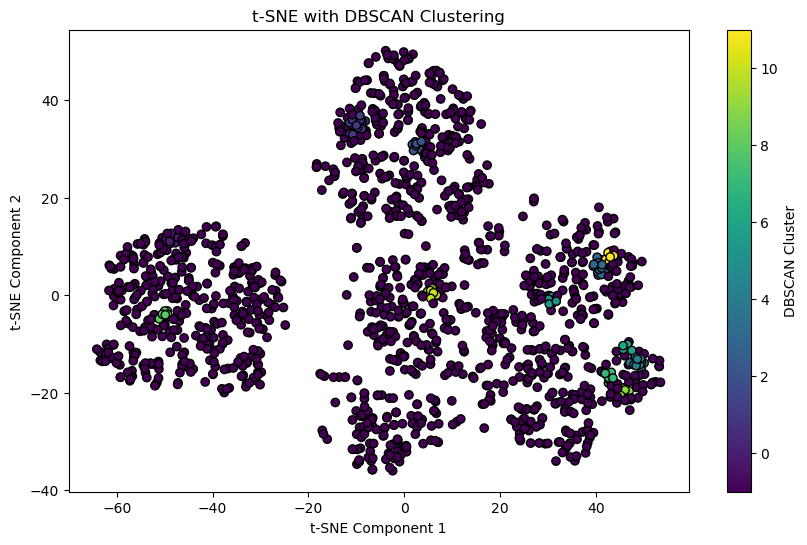

실루엣 점수: 0.759
-1인 클러스터의 샘플수 130 ---- -1 외의 클러스터의 샘플수 1443
-1 클러스터의 샘플비율 91.73553719008265
-1 클러스터를 제외한 샘플비율 8.264462809917356
12


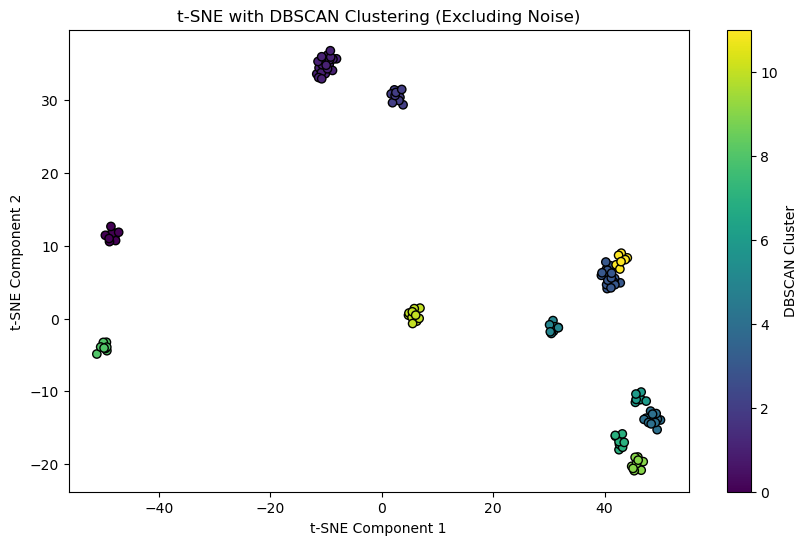

<<<<<<<<<<<<<<<<<<  min_samples = 9  >>>>>>>>>>>>>>>>>>>
eps: 1.25 min_samples: 9


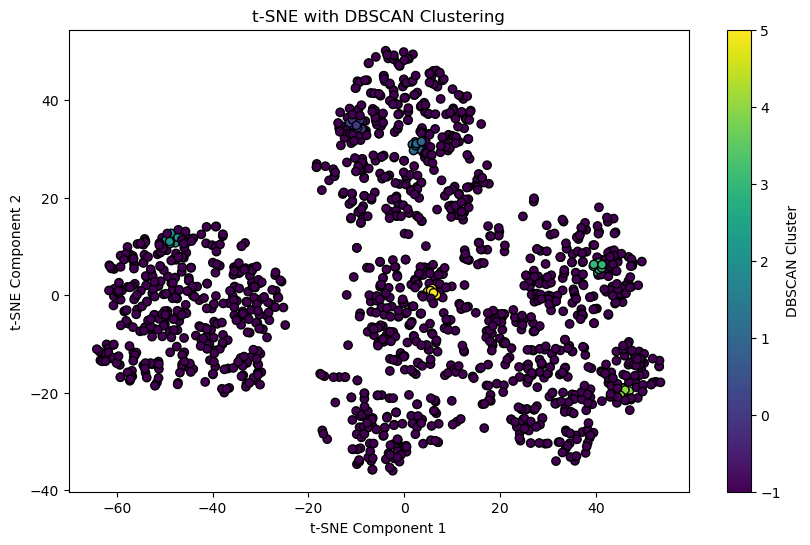

실루엣 점수: 0.936
-1인 클러스터의 샘플수 62 ---- -1 외의 클러스터의 샘플수 1511
-1 클러스터의 샘플비율 96.05848696757788
-1 클러스터를 제외한 샘플비율 3.9415130324221233
6


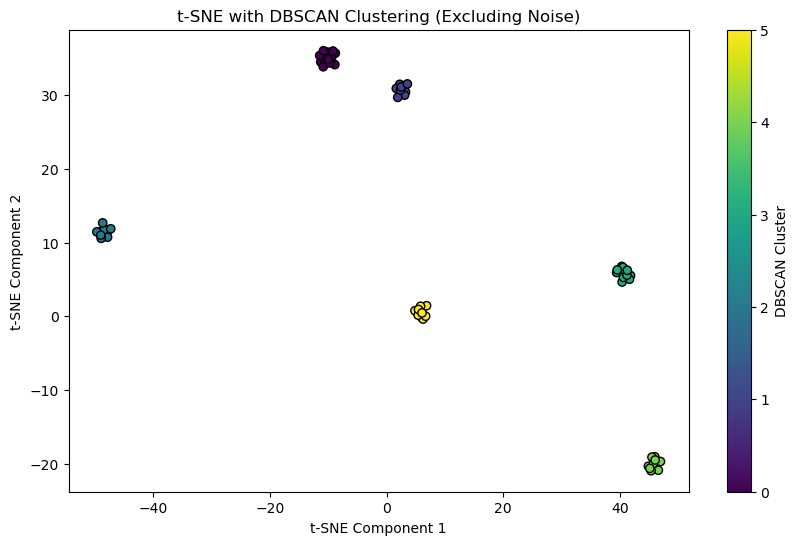

<<<<<<<<<<<<<<<<<<  min_samples = 1  >>>>>>>>>>>>>>>>>>>
eps: 1.5 min_samples: 1


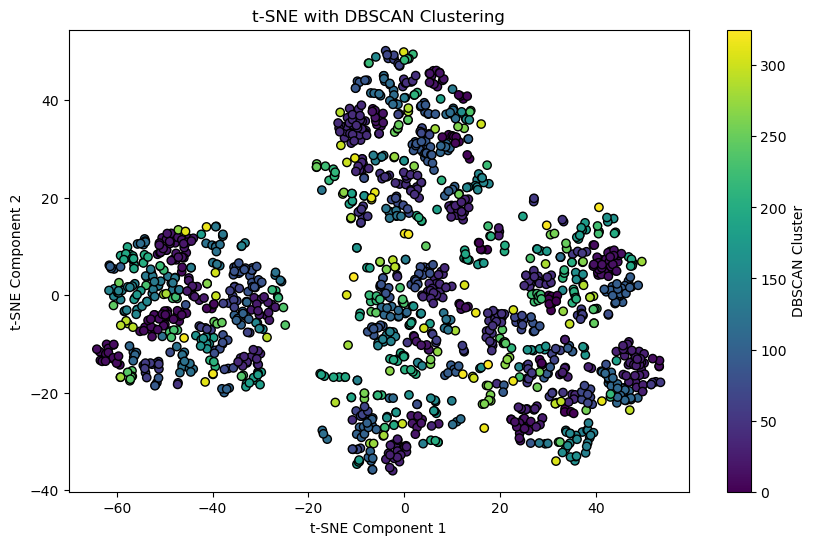

유효한 클러스터가 없거나 클러스터가 하나뿐입니다.
-1인 클러스터의 샘플수 1573 ---- -1 외의 클러스터의 샘플수 0
-1 클러스터의 샘플비율 0.0
-1 클러스터를 제외한 샘플비율 100.0
326


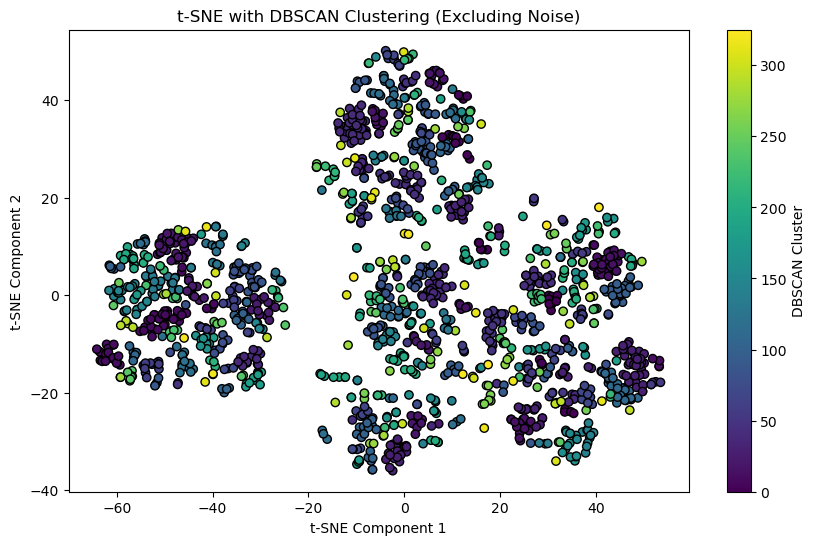

<<<<<<<<<<<<<<<<<<  min_samples = 2  >>>>>>>>>>>>>>>>>>>
eps: 1.5 min_samples: 2


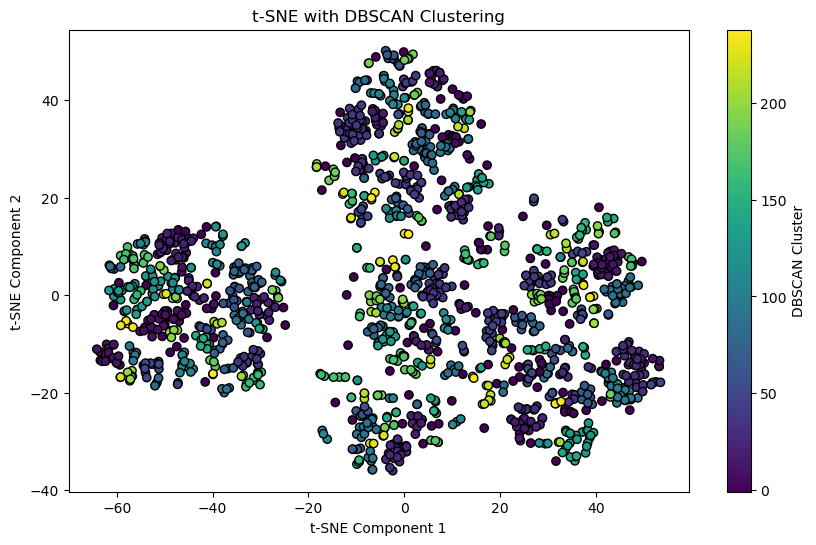

실루엣 점수: 0.445
-1인 클러스터의 샘플수 1486 ---- -1 외의 클러스터의 샘플수 87
-1 클러스터의 샘플비율 5.5308328035600764
-1 클러스터를 제외한 샘플비율 94.46916719643991
239


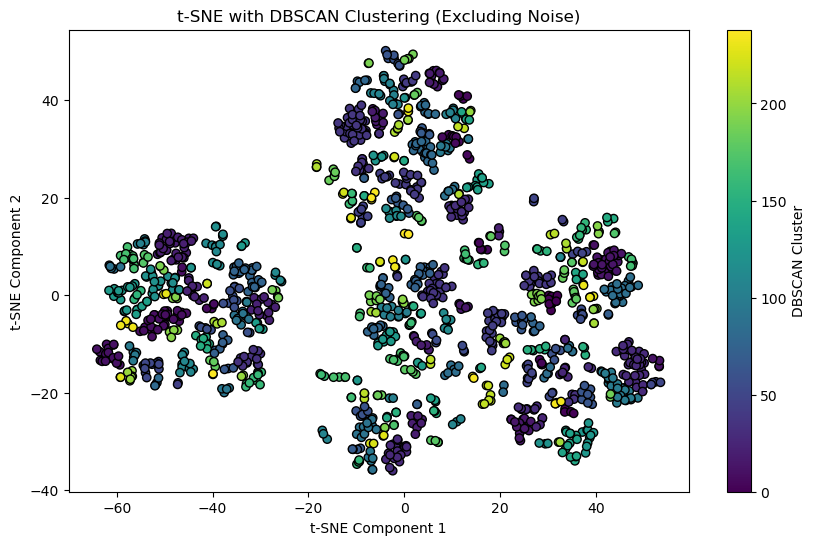

<<<<<<<<<<<<<<<<<<  min_samples = 3  >>>>>>>>>>>>>>>>>>>
eps: 1.5 min_samples: 3


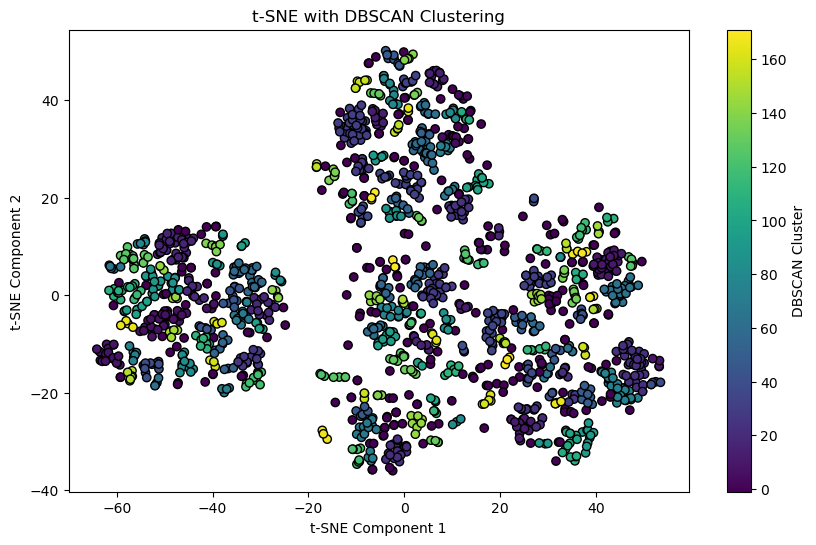

실루엣 점수: 0.466
-1인 클러스터의 샘플수 1352 ---- -1 외의 클러스터의 샘플수 221
-1 클러스터의 샘플비율 14.049586776859504
-1 클러스터를 제외한 샘플비율 85.9504132231405
172


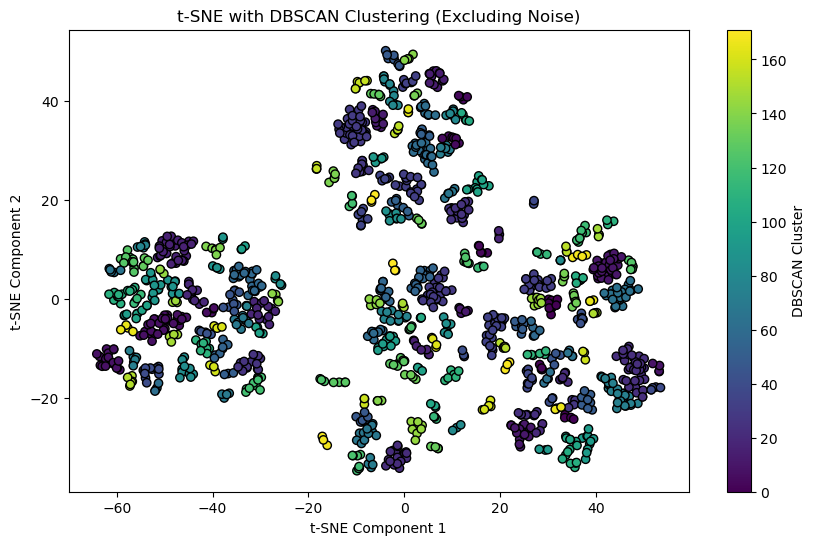

<<<<<<<<<<<<<<<<<<  min_samples = 4  >>>>>>>>>>>>>>>>>>>
eps: 1.5 min_samples: 4


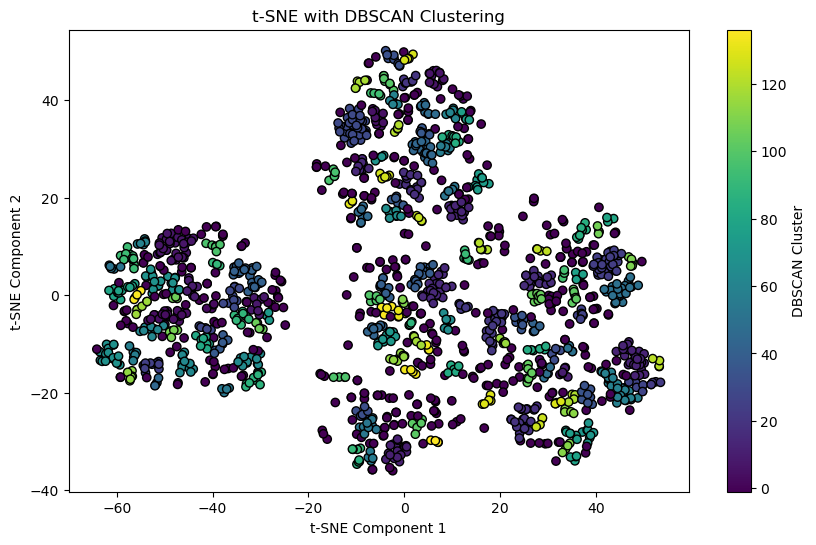

실루엣 점수: 0.497
-1인 클러스터의 샘플수 1189 ---- -1 외의 클러스터의 샘플수 384
-1 클러스터의 샘플비율 24.411951684678957
-1 클러스터를 제외한 샘플비율 75.58804831532105
137


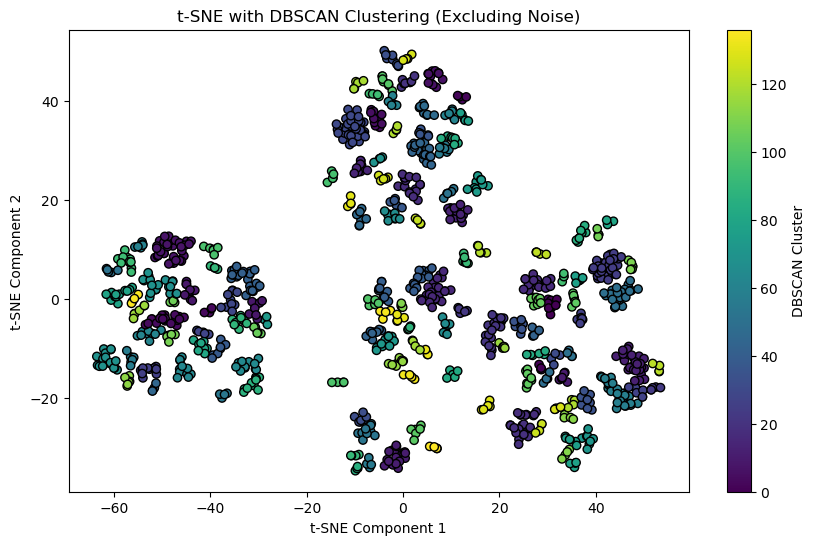

<<<<<<<<<<<<<<<<<<  min_samples = 5  >>>>>>>>>>>>>>>>>>>
eps: 1.5 min_samples: 5


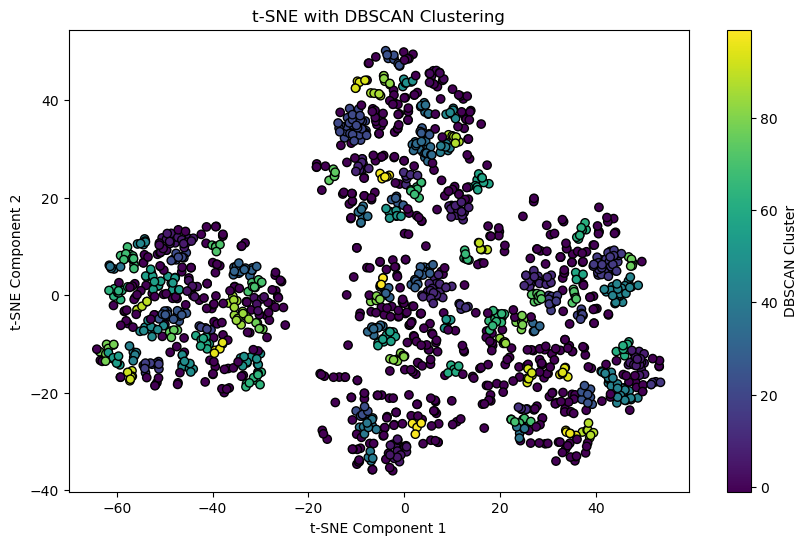

실루엣 점수: 0.547
-1인 클러스터의 샘플수 943 ---- -1 외의 클러스터의 샘플수 630
-1 클러스터의 샘플비율 40.05085823267641
-1 클러스터를 제외한 샘플비율 59.94914176732359
100


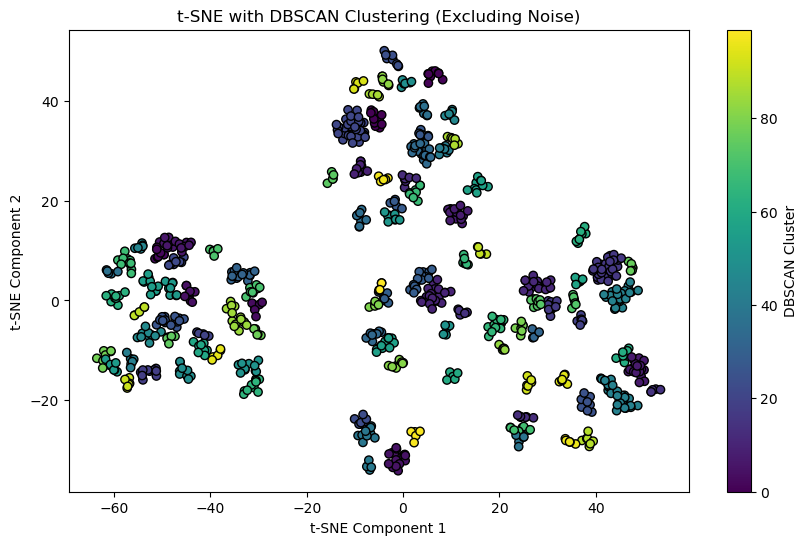

<<<<<<<<<<<<<<<<<<  min_samples = 6  >>>>>>>>>>>>>>>>>>>
eps: 1.5 min_samples: 6


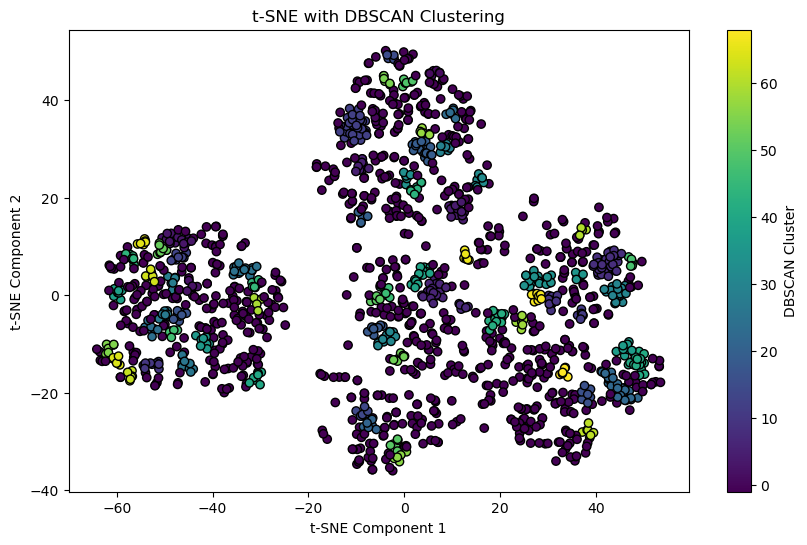

실루엣 점수: 0.588
-1인 클러스터의 샘플수 693 ---- -1 외의 클러스터의 샘플수 880
-1 클러스터의 샘플비율 55.94405594405595
-1 클러스터를 제외한 샘플비율 44.05594405594406
69


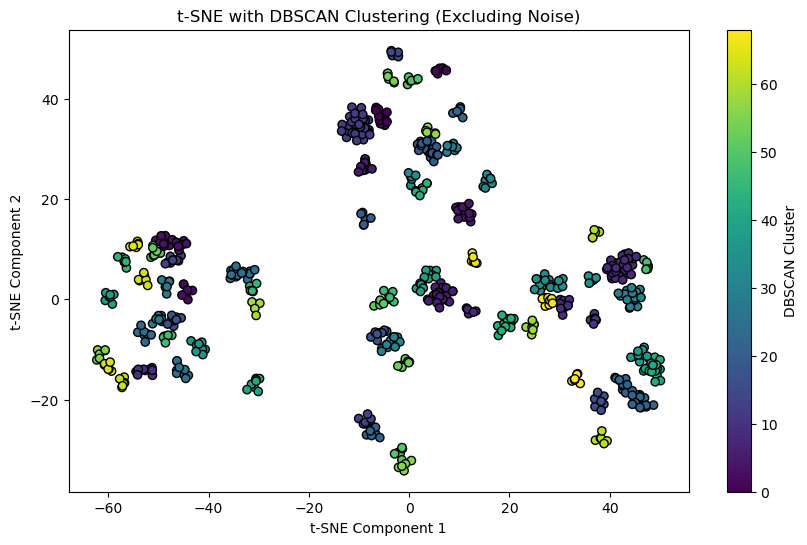

<<<<<<<<<<<<<<<<<<  min_samples = 7  >>>>>>>>>>>>>>>>>>>
eps: 1.5 min_samples: 7


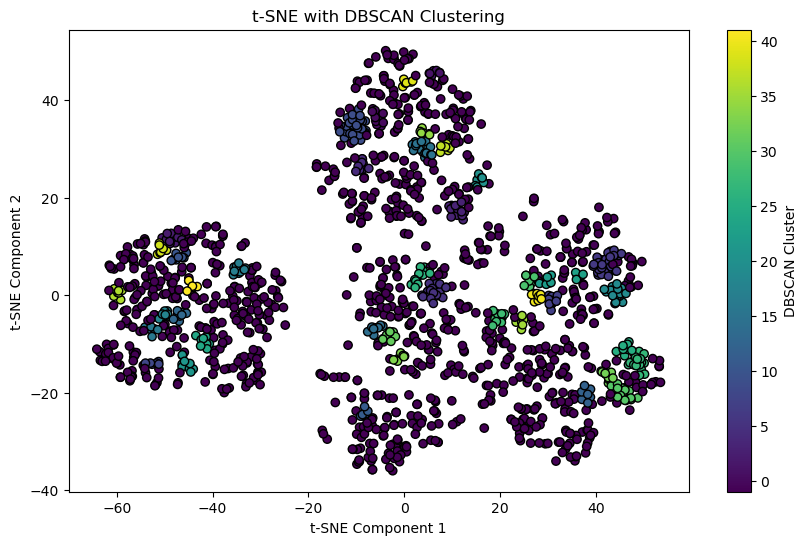

실루엣 점수: 0.618
-1인 클러스터의 샘플수 478 ---- -1 외의 클러스터의 샘플수 1095
-1 클러스터의 샘플비율 69.61220597584233
-1 클러스터를 제외한 샘플비율 30.38779402415766
42


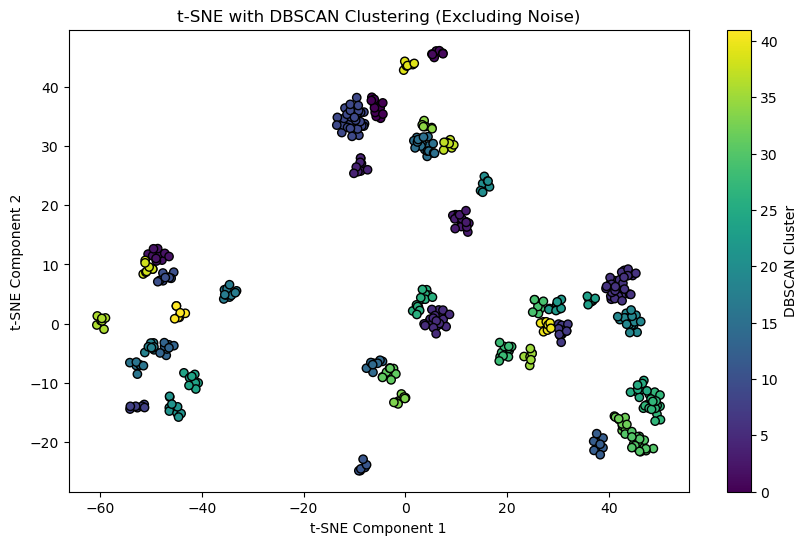

<<<<<<<<<<<<<<<<<<  min_samples = 8  >>>>>>>>>>>>>>>>>>>
eps: 1.5 min_samples: 8


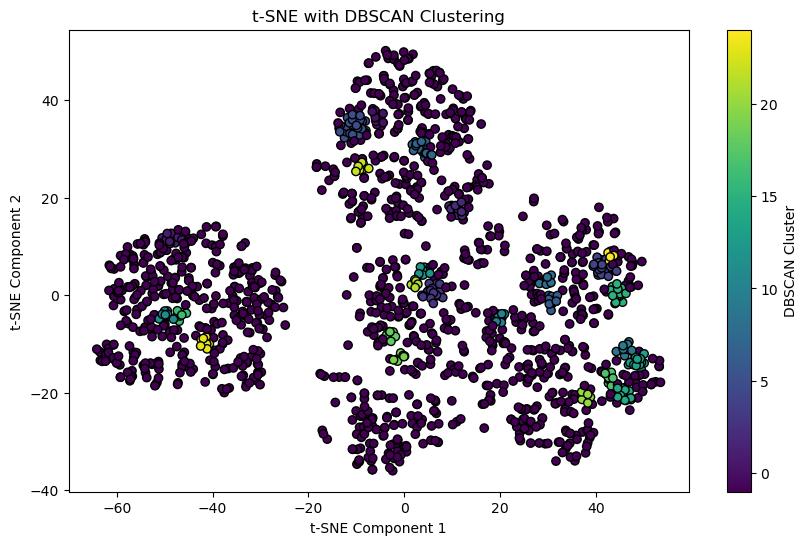

실루엣 점수: 0.644
-1인 클러스터의 샘플수 302 ---- -1 외의 클러스터의 샘플수 1271
-1 클러스터의 샘플비율 80.80101716465353
-1 클러스터를 제외한 샘플비율 19.198982835346474
25


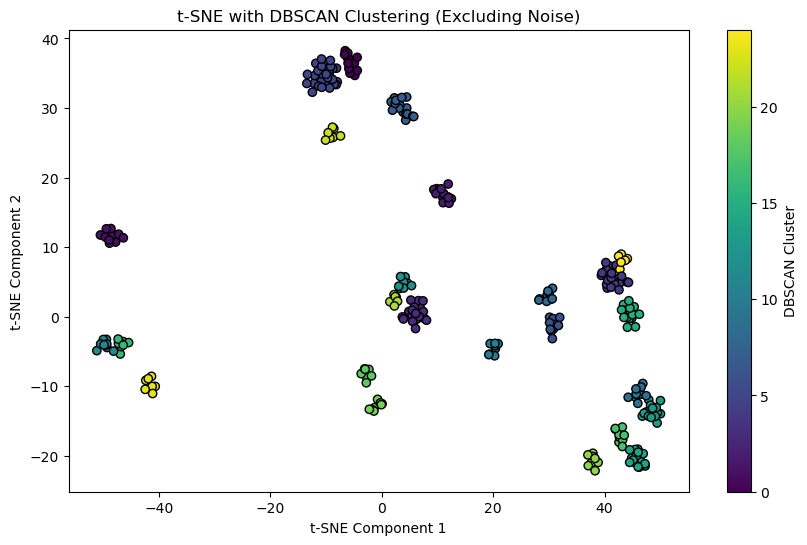

<<<<<<<<<<<<<<<<<<  min_samples = 9  >>>>>>>>>>>>>>>>>>>
eps: 1.5 min_samples: 9


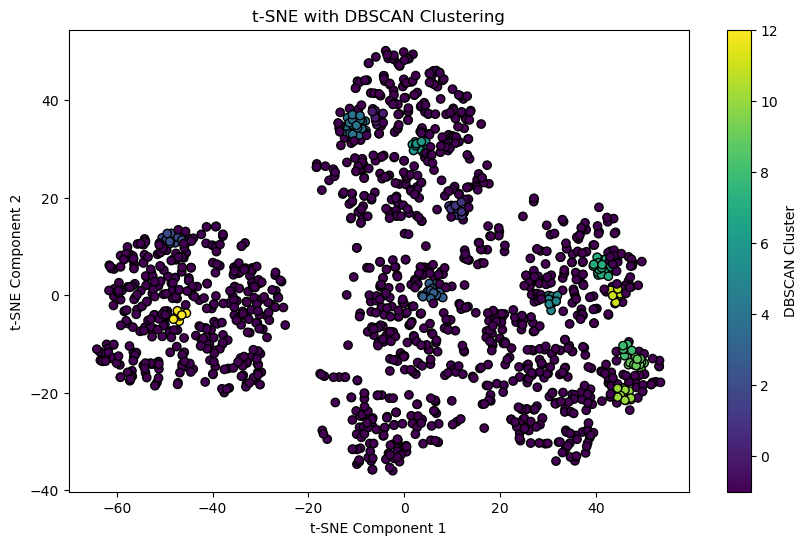

실루엣 점수: 0.744
-1인 클러스터의 샘플수 185 ---- -1 외의 클러스터의 샘플수 1388
-1 클러스터의 샘플비율 88.23903369357915
-1 클러스터를 제외한 샘플비율 11.760966306420851
13


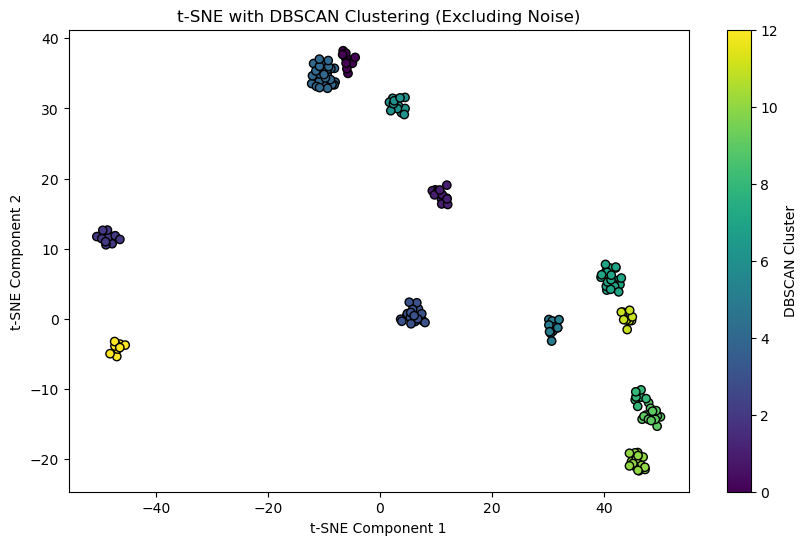

<<<<<<<<<<<<<<<<<<  min_samples = 1  >>>>>>>>>>>>>>>>>>>
eps: 1.75 min_samples: 1


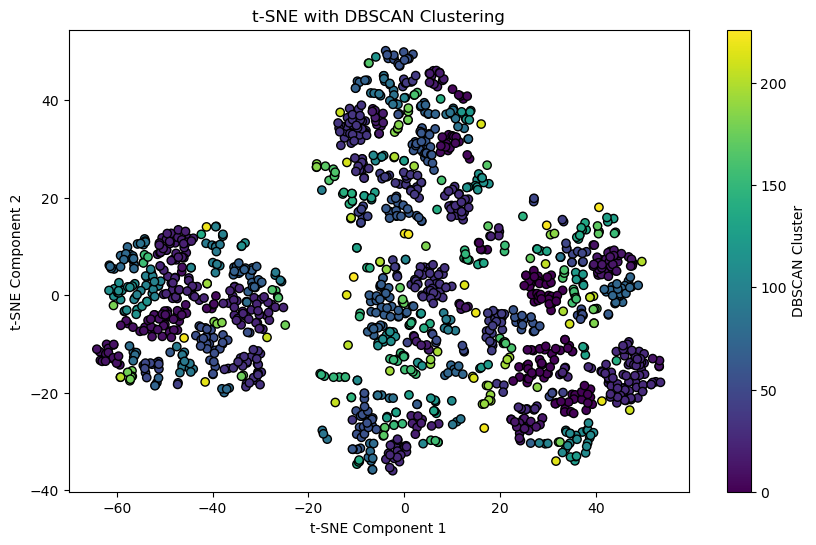

유효한 클러스터가 없거나 클러스터가 하나뿐입니다.
-1인 클러스터의 샘플수 1573 ---- -1 외의 클러스터의 샘플수 0
-1 클러스터의 샘플비율 0.0
-1 클러스터를 제외한 샘플비율 100.0
227


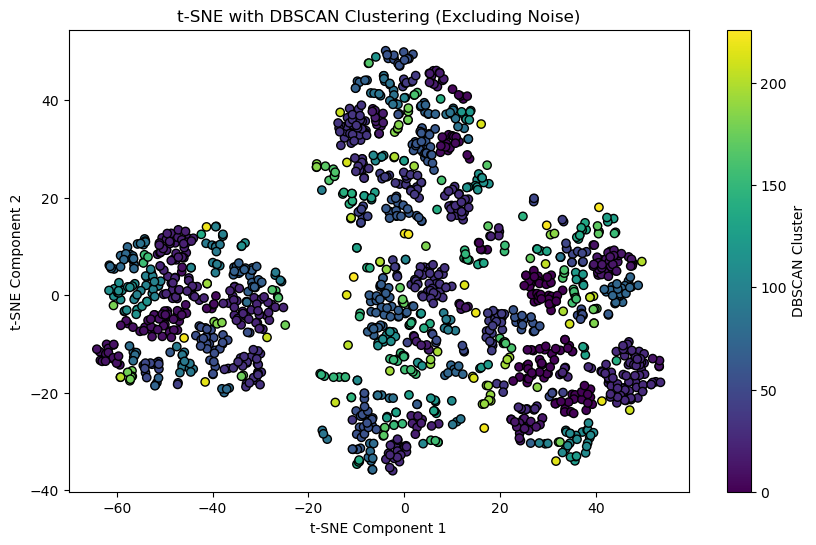

<<<<<<<<<<<<<<<<<<  min_samples = 2  >>>>>>>>>>>>>>>>>>>
eps: 1.75 min_samples: 2


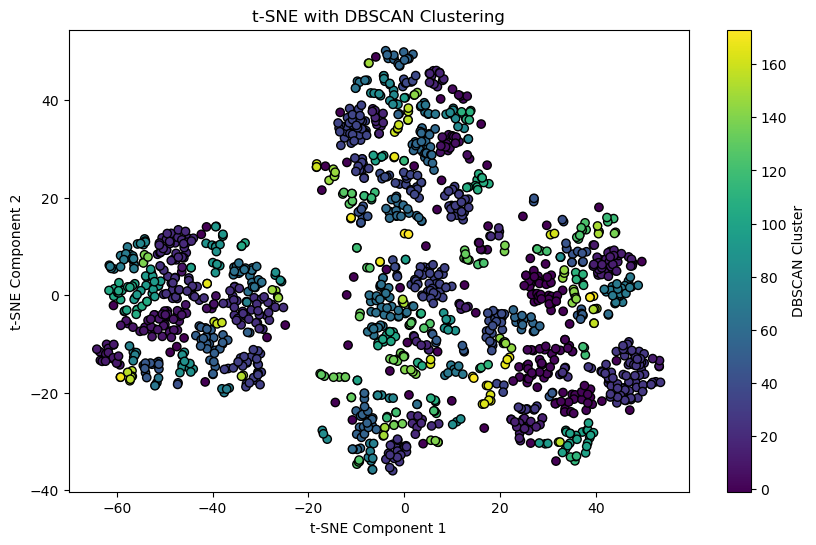

실루엣 점수: 0.341
-1인 클러스터의 샘플수 1520 ---- -1 외의 클러스터의 샘플수 53
-1 클러스터의 샘플비율 3.3693579148124604
-1 클러스터를 제외한 샘플비율 96.63064208518753
174


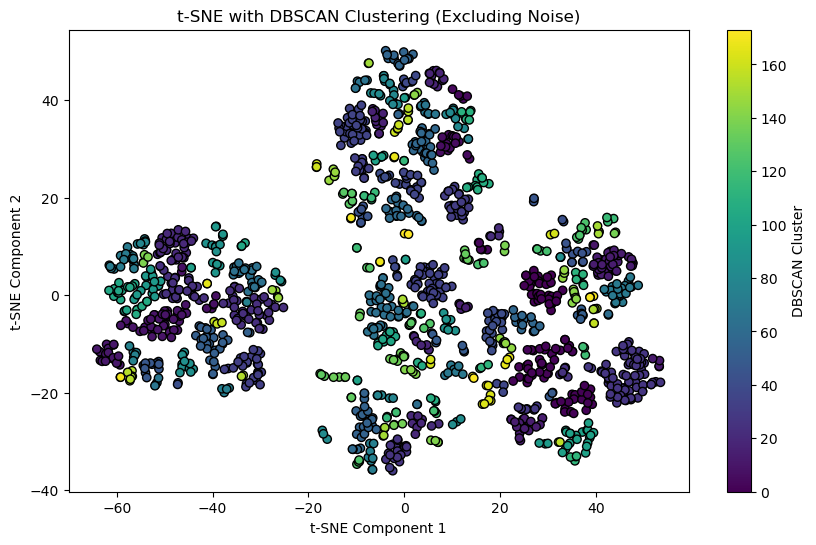

<<<<<<<<<<<<<<<<<<  min_samples = 3  >>>>>>>>>>>>>>>>>>>
eps: 1.75 min_samples: 3


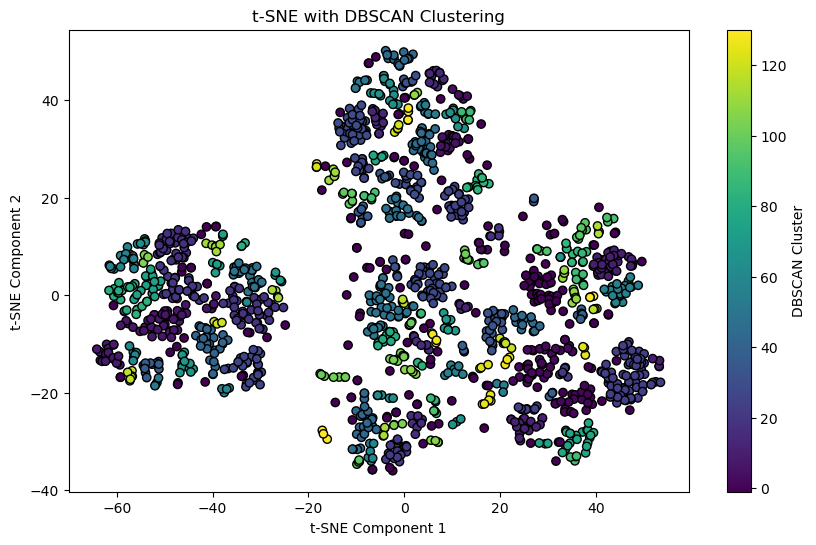

실루엣 점수: 0.375
-1인 클러스터의 샘플수 1434 ---- -1 외의 클러스터의 샘플수 139
-1 클러스터의 샘플비율 8.83661792752702
-1 클러스터를 제외한 샘플비율 91.16338207247298
131


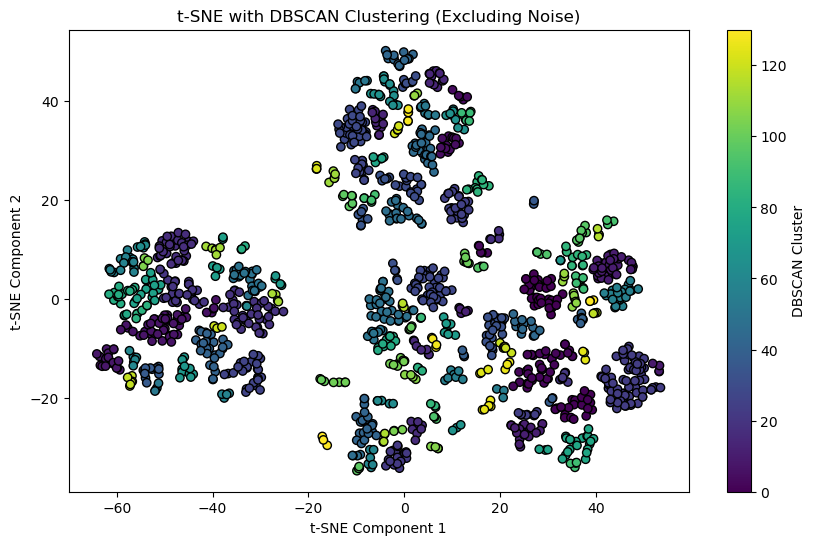

<<<<<<<<<<<<<<<<<<  min_samples = 4  >>>>>>>>>>>>>>>>>>>
eps: 1.75 min_samples: 4


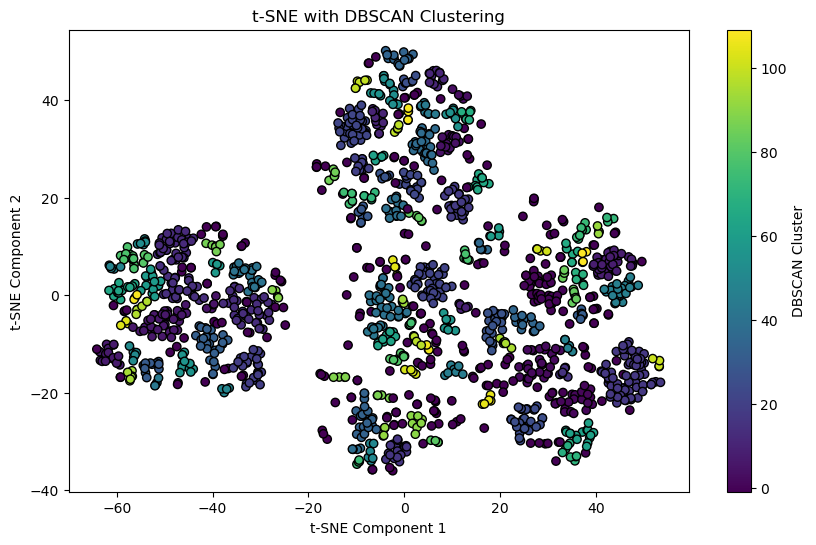

실루엣 점수: 0.411
-1인 클러스터의 샘플수 1323 ---- -1 외의 클러스터의 샘플수 250
-1 클러스터의 샘플비율 15.89319771137953
-1 클러스터를 제외한 샘플비율 84.10680228862047
110


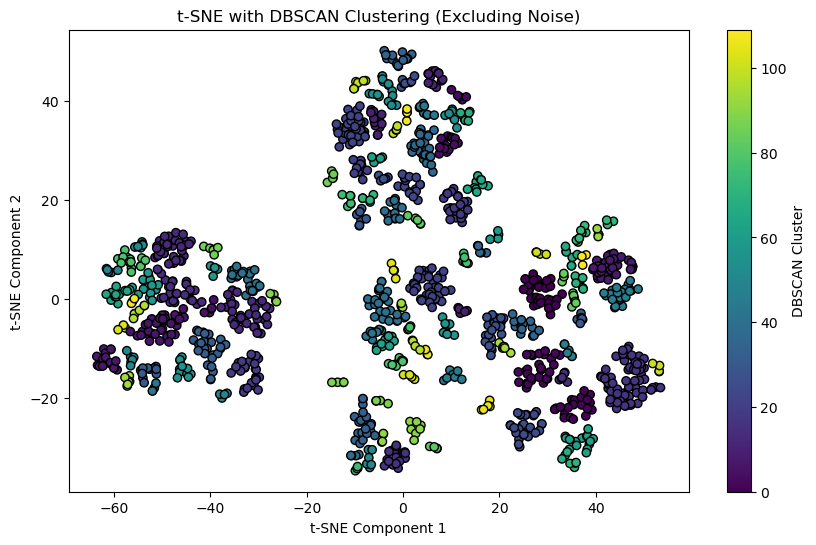

<<<<<<<<<<<<<<<<<<  min_samples = 5  >>>>>>>>>>>>>>>>>>>
eps: 1.75 min_samples: 5


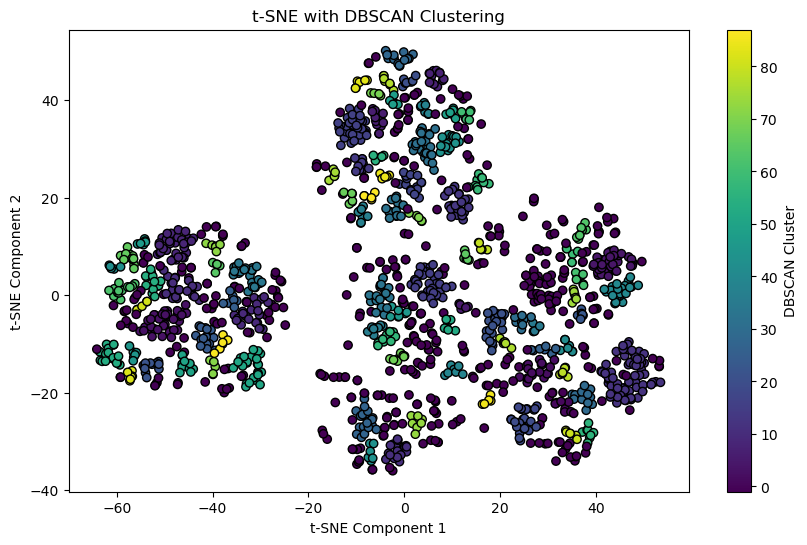

실루엣 점수: 0.487
-1인 클러스터의 샘플수 1166 ---- -1 외의 클러스터의 샘플수 407
-1 클러스터의 샘플비율 25.874125874125873
-1 클러스터를 제외한 샘플비율 74.12587412587412
88


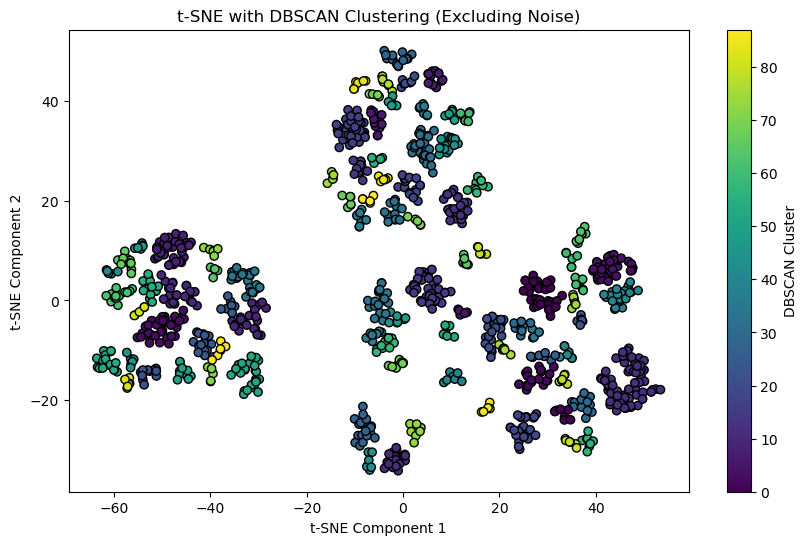

<<<<<<<<<<<<<<<<<<  min_samples = 6  >>>>>>>>>>>>>>>>>>>
eps: 1.75 min_samples: 6


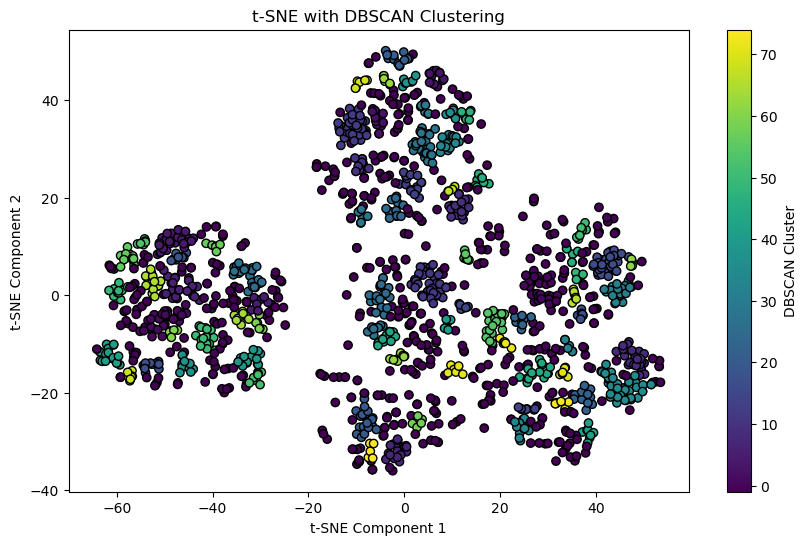

실루엣 점수: 0.512
-1인 클러스터의 샘플수 1006 ---- -1 외의 클러스터의 샘플수 567
-1 클러스터의 샘플비율 36.04577240940877
-1 클러스터를 제외한 샘플비율 63.95422759059123
75


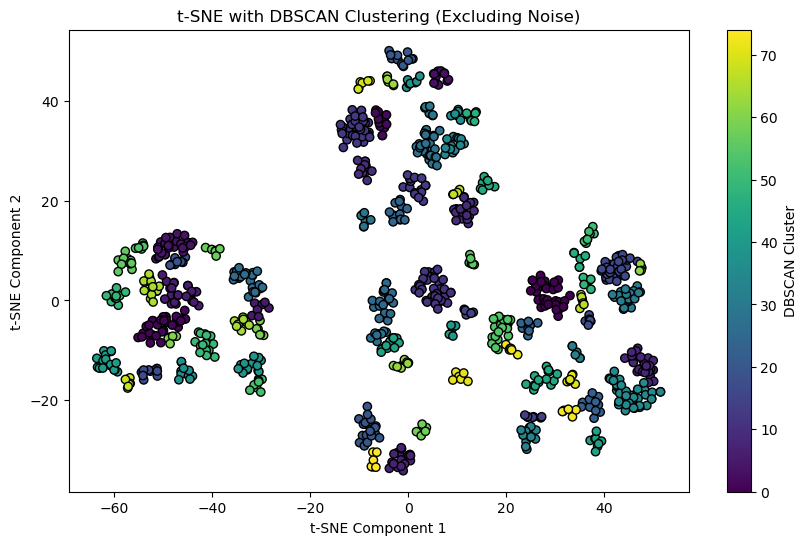

<<<<<<<<<<<<<<<<<<  min_samples = 7  >>>>>>>>>>>>>>>>>>>
eps: 1.75 min_samples: 7


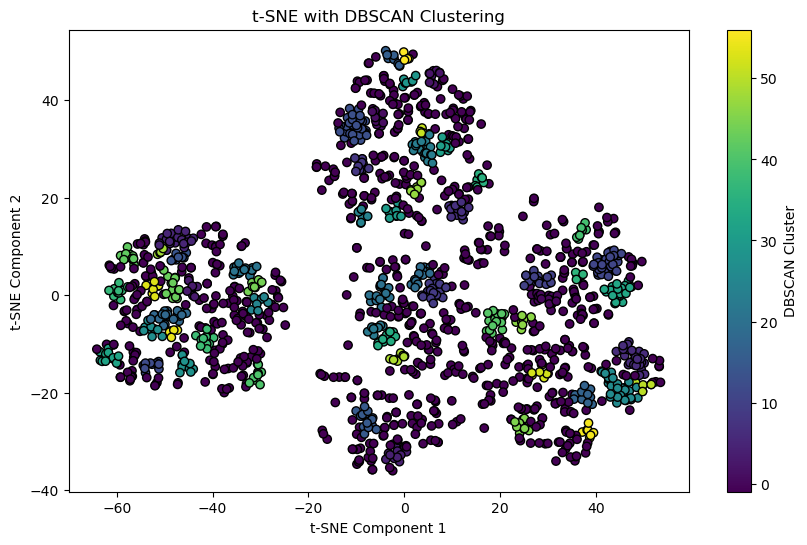

실루엣 점수: 0.553
-1인 클러스터의 샘플수 753 ---- -1 외의 클러스터의 샘플수 820
-1 클러스터의 샘플비율 52.129688493324856
-1 클러스터를 제외한 샘플비율 47.870311506675144
57


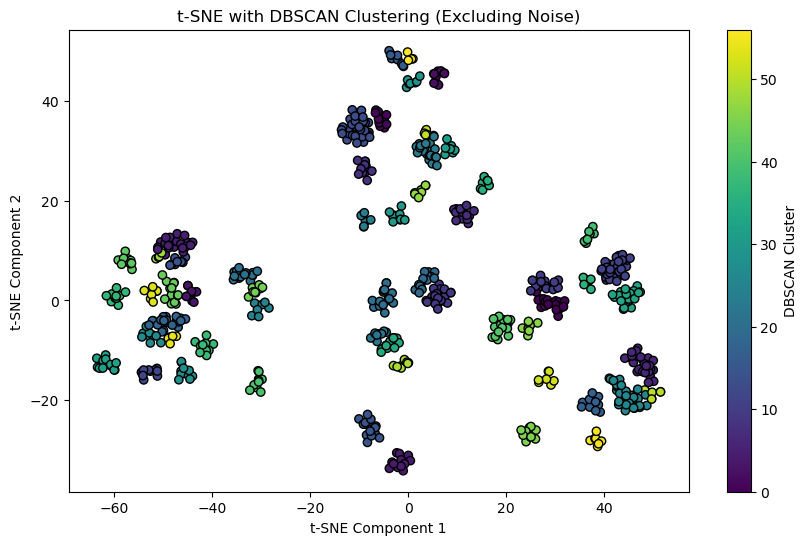

<<<<<<<<<<<<<<<<<<  min_samples = 8  >>>>>>>>>>>>>>>>>>>
eps: 1.75 min_samples: 8


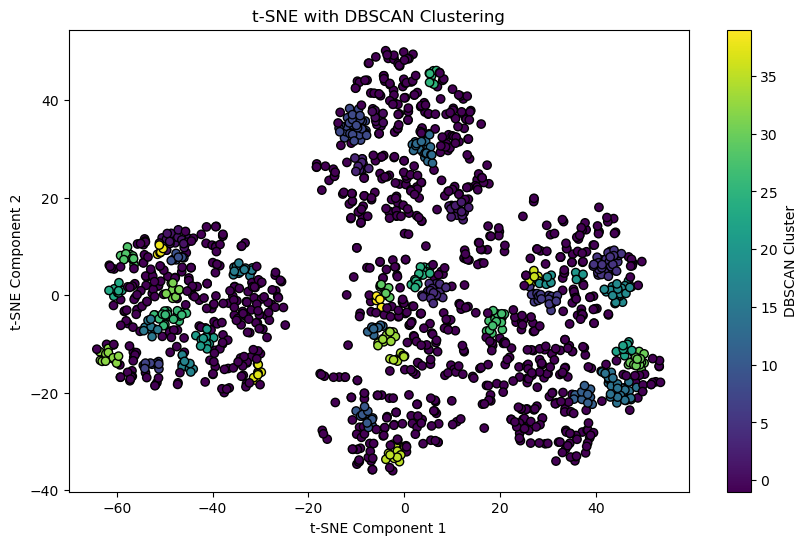

실루엣 점수: 0.597
-1인 클러스터의 샘플수 566 ---- -1 외의 클러스터의 샘플수 1007
-1 클러스터의 샘플비율 64.01780038143674
-1 클러스터를 제외한 샘플비율 35.98219961856326
40


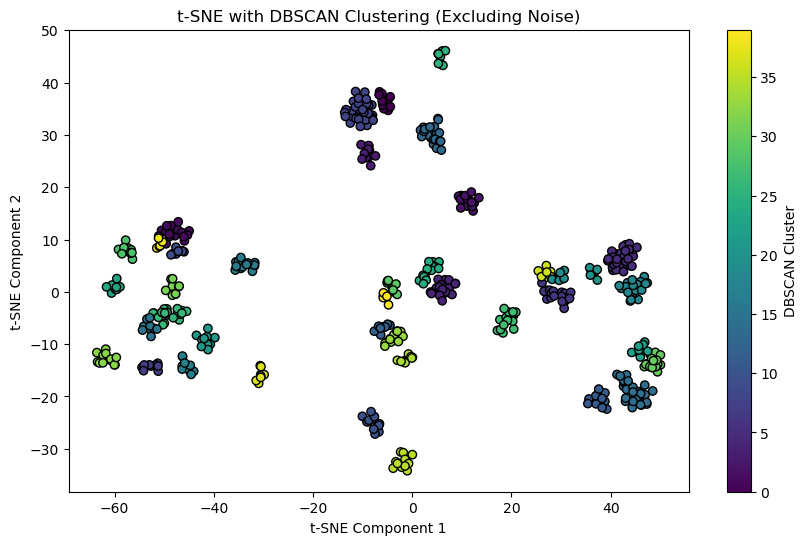

<<<<<<<<<<<<<<<<<<  min_samples = 9  >>>>>>>>>>>>>>>>>>>
eps: 1.75 min_samples: 9


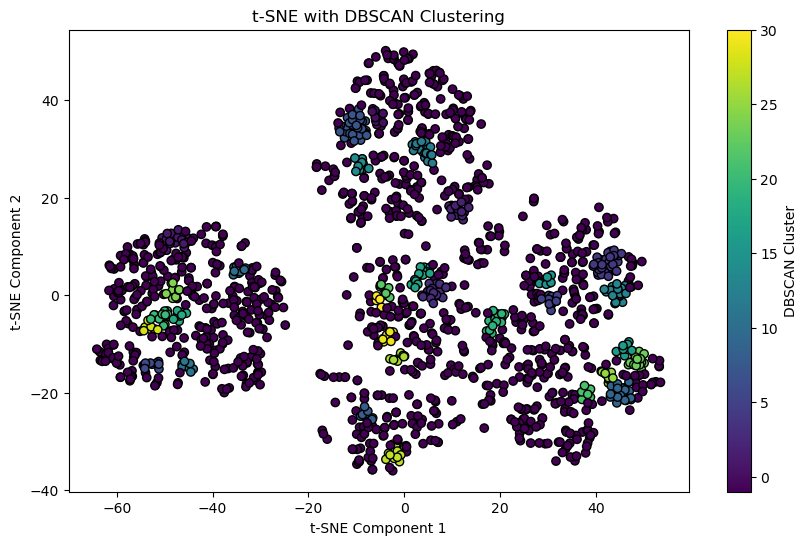

실루엣 점수: 0.637
-1인 클러스터의 샘플수 435 ---- -1 외의 클러스터의 샘플수 1138
-1 클러스터의 샘플비율 72.34583598219962
-1 클러스터를 제외한 샘플비율 27.65416401780038
31


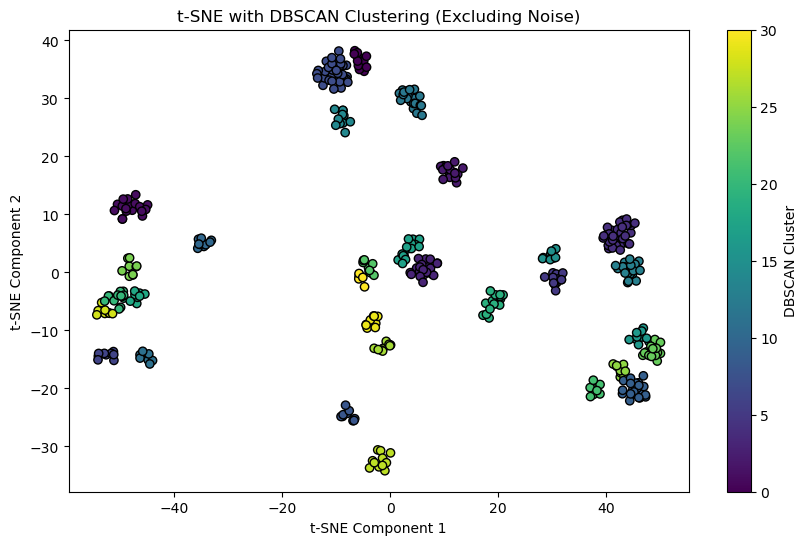

In [70]:
# 데이터프레임에서 필요한 컬럼 선택 및 스케일링
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_encoded[minmax_columns])

X = pd.concat([pd.DataFrame(scaled_data),df_encoded[onehot_columns]], axis=1).to_numpy()

# KNN 거리 그래프 생성
neighbors = 27 #combined_df(onehot 인코딩 전)의 차원 수로 설정
nbrs = NearestNeighbors(n_neighbors=neighbors+1).fit(X)
distances, indices = nbrs.kneighbors(X)

# KNN 거리 정렬
distances = np.sort(distances[:, neighbors - 1], axis=0)

# 거리 그래프 시각화
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title('KNN Distance Graph')
plt.xlabel('Points sorted by distance')
plt.ylabel(f'{neighbors}-th Nearest Neighbor Distance')
plt.grid()
plt.show()



silhouette_score_test = []
dbscan_min_samples = []
dbscan_eps = []
one_minus_noise_ratio = []
noise_nums = []
num_of_clusters = []

# t-SNE 적용
tsne = TSNE(n_components=2, random_state=42)
tsne_data = tsne.fit_transform(X)

# eps 값 loop로 선택 후 DBSCAN 적용
for eps in np.arange(1.25,2.00,0.25):
    for j in range(1,10,1): # minsamples 값 loop로 선택 후 DBSCAN 적용
        min_samples = int(j)  # 데이터의 차원 수 + 1 (27 + 1 = 28)

        # DBSCAN 클러스터링
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan_labels = dbscan.fit_predict(tsne_data)

        # 클러스터 레이블 추가
        df_encoded['dbscan_cluster'] = dbscan_labels
        combined_df['dbscan_cluster'] = dbscan_labels
        
        print(f'<<<<<<<<<<<<<<<<<<  min_samples = {j}  >>>>>>>>>>>>>>>>>>>')
        print('eps:', eps, 'min_samples:', min_samples)
        
        dbscan_min_samples.append(min_samples)
        dbscan_eps.append(eps)
        num_of_clusters.append(len(set(combined_df['dbscan_cluster'].tolist()))-1)
        
        # t-SNE 결과 시각화
        plt.figure(figsize=(10, 6))
        plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c=dbscan_labels, cmap='viridis', marker='o', edgecolor='k')
        plt.title('t-SNE with DBSCAN Clustering')
        plt.xlabel('t-SNE Component 1')
        plt.ylabel('t-SNE Component 2')
        plt.colorbar(label='DBSCAN Cluster')
        plt.show()

        # 실루엣 점수 계산 (노이즈를 제외한 클러스터만 사용)
        if len(set(dbscan_labels)) > 1 and -1 in dbscan_labels:
            # 클러스터 레이블이 -1이 아닌 데이터만 선택
            valid_labels = dbscan_labels[dbscan_labels != -1]
            valid_data = tsne_data[dbscan_labels != -1]

            silhouette_avg = silhouette_score(valid_data, valid_labels)
            print(f'실루엣 점수: {silhouette_avg:.3f}')
            silhouette_score_test.append([j, silhouette_avg])
        else:
            print('유효한 클러스터가 없거나 클러스터가 하나뿐입니다.')
            silhouette_score_test.append([j, silhouette_avg])

        try:
            # '-1' 클러스터와 전자를 제외한 클러스터들의 샘플수:
            print('-1인 클러스터의 샘플수',len(combined_df[combined_df['dbscan_cluster']!=-1]),'----','-1 외의 클러스터의 샘플수',len(combined_df[combined_df['dbscan_cluster']==-1]))
            #'-1'인 클러스터의 비율
            print('-1 클러스터의 샘플비율',float(len(combined_df[combined_df['dbscan_cluster']==-1])/len(combined_df)*100))
            # '-1' 클러스터를 제외한 클러스터의 비율
            print('-1 클러스터를 제외한 샘플비율',float(len(combined_df[combined_df['dbscan_cluster']!=-1])/len(combined_df)*100))
            # '-1' 클러스터 외의 클러스터의 갯수
            print(len(set(combined_df[combined_df['dbscan_cluster']!=-1]['dbscan_cluster'].tolist())))
        except:
            pass
        one_minus_noise_ratio.append(float(len(combined_df[combined_df['dbscan_cluster']!=-1])/len(combined_df)*100))
        noise_nums.append(len(combined_df[combined_df['dbscan_cluster']==-1]))
        
        # 클러스터 레이블이 -1이 아닌 데이터 포인트만 필터링
        mask = dbscan_labels != -1
        filtered_tsne_data = tsne_data[mask]
        filtered_labels = dbscan_labels[mask]

        # 시각화
        plt.figure(figsize=(10, 6))
        plt.scatter(filtered_tsne_data[:, 0], filtered_tsne_data[:, 1], c=filtered_labels, cmap='viridis', marker='o', edgecolor='k')
        plt.title('t-SNE with DBSCAN Clustering (Excluding Noise)')
        plt.xlabel('t-SNE Component 1')
        plt.ylabel('t-SNE Component 2')
        plt.colorbar(label='DBSCAN Cluster')
        plt.show()

In [ ]:
df_check = pd.DataFrame(data = {'min_samples':dbscan_min_samples, 'eps':dbscan_eps, 'silhouette':[i[1]for i in silhouette_score_test],
                                'num_of_clusters':num_of_clusters,'1-noise ratio':one_minus_noise_ratio,'noise ratio':[100-i for i in one_minus_noise_ratio],
                                'clustered noise data':noise_nums,'clustered data':[1573 - x for x in noise_nums]})
df_100 = df_check[(df_check['num_of_clusters']<100)]
#클러스터 생성 수가 100개 이하의 dbscan 클러스터링 조건들 중에, 노이즈 비율이 낮은 순으로 볼 때, 실루엣 점수가 50 이상인 클러스터를 선정
#df_check 기준 index 번호가 23번

,min_samples,eps,silhouette,num_of_clusters,1-noise ratio,noise ratio,clustered noise data,clustered data
4,5,1.25,0.642489,78,39.351558,60.648442,954,619
5,6,1.25,0.645022,42,25.111252,74.888748,1178,395
6,7,1.25,0.676229,23,15.384615,84.615385,1331,242
7,8,1.25,0.759026,12,8.264463,91.735537,1443,130
8,9,1.25,0.936439,6,3.941513,96.058487,1511,62
14,6,1.50,0.587581,69,44.055944,55.944056,880,693
15,7,1.50,0.618470,42,30.387794,69.612206,1095,478
16,8,1.50,0.643934,25,19.198983,80.801017,1271,302
17,9,1.50,0.743835,13,11.760966,88.239034,1388,185
22,5,1.75,0.487259,88,74.125874,25.874126,407,1166


##### 클러스터 생성 수가 100개 이하의 dbscan 클러스터링 조건들 중에, 노이즈 비율이 낮은 순으로 볼 때, 실루엣 점수가 50 이상인 클러스터를 선정
##### eps=1.75, min_samples=6

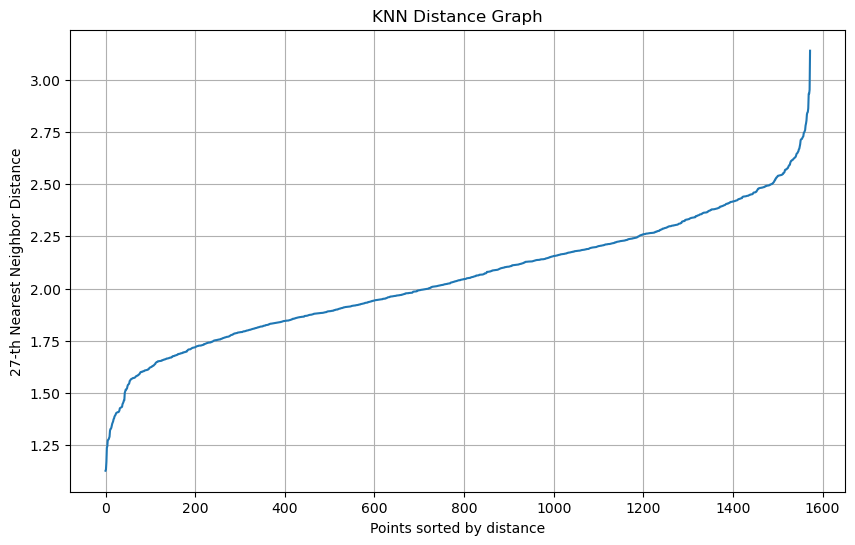

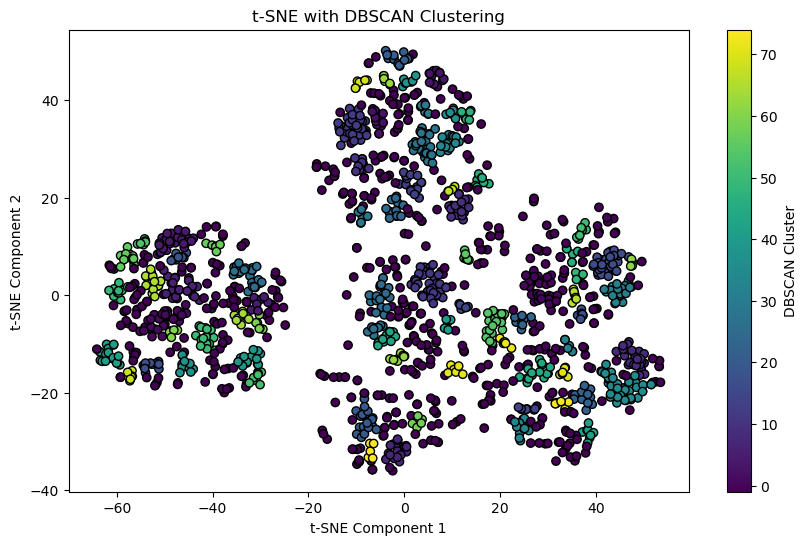

실루엣 점수: 0.512


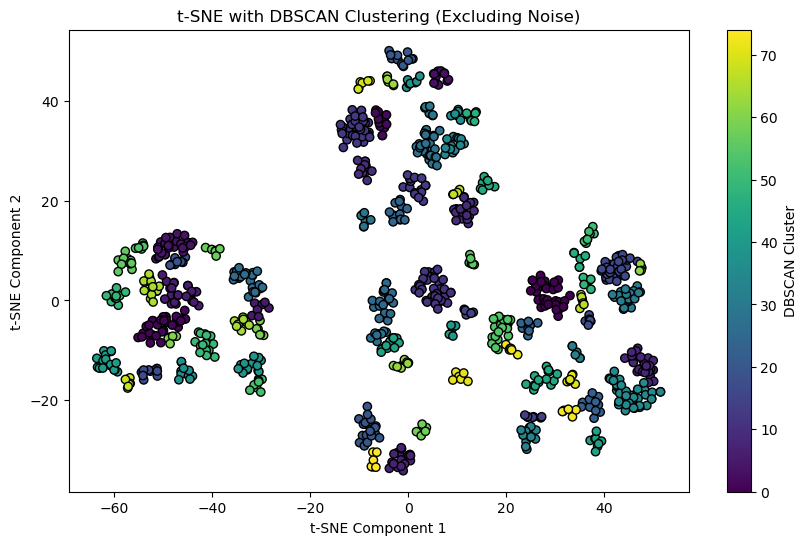

In [86]:
# 데이터프레임에서 필요한 컬럼 선택 및 스케일링
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_encoded[minmax_columns])

X = pd.concat([pd.DataFrame(scaled_data),df_encoded[onehot_columns]], axis=1).to_numpy()

# KNN 거리 그래프 생성
neighbors = 27 #combined_df(onehot 인코딩 전)의 차원 수로 설정
nbrs = NearestNeighbors(n_neighbors=neighbors+1).fit(X)
distances, indices = nbrs.kneighbors(X)

# KNN 거리 정렬
distances = np.sort(distances[:, neighbors - 1], axis=0)

# 거리 그래프 시각화
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title('KNN Distance Graph')
plt.xlabel('Points sorted by distance')
plt.ylabel(f'{neighbors}-th Nearest Neighbor Distance')
plt.grid()
plt.show()

# eps 값 선택 후 DBSCAN 적용
eps = 1.75  # 시각적으로 결정한 eps 값을 입력: 2.5
min_samples = 6

# t-SNE 적용
tsne = TSNE(n_components=2, random_state=42)
tsne_data = tsne.fit_transform(X)

# DBSCAN 클러스터링
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
dbscan_labels = dbscan.fit_predict(tsne_data)

# 클러스터 레이블 추가
df_encoded['dbscan_cluster'] = dbscan_labels
combined_df['dbscan_cluster'] = dbscan_labels

# t-SNE 결과 시각화
plt.figure(figsize=(10, 6))
plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c=dbscan_labels, cmap='viridis', marker='o', edgecolor='k')
plt.title('t-SNE with DBSCAN Clustering')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='DBSCAN Cluster')
plt.show()

# 실루엣 점수 계산 (노이즈를 제외한 클러스터만 사용)
if len(set(dbscan_labels)) > 1 and -1 in dbscan_labels:
    # 클러스터 레이블이 -1이 아닌 데이터만 선택
    valid_labels = dbscan_labels[dbscan_labels != -1]
    valid_data = tsne_data[dbscan_labels != -1]

    silhouette_avg = silhouette_score(valid_data, valid_labels)
    print(f'실루엣 점수: {silhouette_avg:.3f}')
else:
    print('유효한 클러스터가 없거나 클러스터가 하나뿐입니다.')

# 클러스터 레이블이 -1이 아닌 데이터 포인트만 필터링
mask = dbscan_labels != -1
filtered_tsne_data = tsne_data[mask]
filtered_labels = dbscan_labels[mask]

# 시각화
plt.figure(figsize=(10, 6))
plt.scatter(filtered_tsne_data[:, 0], filtered_tsne_data[:, 1], c=filtered_labels, cmap='viridis', marker='o', edgecolor='k')
plt.title('t-SNE with DBSCAN Clustering (Excluding Noise)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='DBSCAN Cluster')
plt.show()

# combined_df를 cluster_df로 저장 및 csv로 저장

In [89]:
cluster_df = combined_df.copy()
cluster_df

,RESPOND_ID,EXAMIN_BEGIN_DE,SEX,AGE,AREA,INCOME,SEOUL,GYEONGGI,BUSAN,CHUNGNAM,...,Transport,Shopping,Activity,Etc,Company,Per_Diem,Married,Children,Occupation,dbscan_cluster
0,53364346,20240101,0,50,서울특별시,1,3,4,3,3,...,1,1,1,3,2,2,1,자녀 성인(막내 대학),사무/기술직,0
1,53363665,20240101,0,50,서울특별시,0,3,3,4,3,...,5,1,1,1,2,2,1,자녀 성인(막내 대학),판매/서비스직,73
2,53322894,20240101,0,50,서울특별시,1,3,4,4,3,...,1,1,1,1,4,2,1,자녀 성인(막내 대학),자영업,44
3,53349009,20240101,0,50,서울특별시,1,1,2,3,4,...,10,1,1,1,3,5,1,자녀 성장(막내 중고생),전업주부,-1
4,53340551,20240101,0,40,경상남도,1,3,3,3,3,...,10,10,10,1,3,4,1,자녀 유아&성장(막내 입학전~초등생),사무/기술직,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1568,53366910,20241230,1,50,전라남도,0,2,2,2,2,...,10,1,5,10,5,2,0,미혼,사무/기술직,-1
1569,53367792,20241230,0,50,부산광역시,1,3,3,3,4,...,10,1,5,1,4,4,1,자녀 성인(막내 대학),기능/숙련/일반작업직,-1
1570,53367863,20241230,0,40,경기도,1,1,2,4,2,...,3,1,1,1,5,3,1,자녀 유아&성장(막내 입학전~초등생),사무/기술직,2
1571,53369696,20241230,1,50,서울특별시,1,3,4,1,1,...,5,1,1,1,4,3,1,자녀 성인(막내 대학),사무/기술직,0


In [91]:
cluster_df.to_csv('preprocessed data/cluster_df')

In [93]:
cluster_df = combined_df.copy()
cluster_df.to_csv('preprocessed data/cluster_df.csv')